In [1]:
import pandas as pd
import numpy as np

In [2]:
DATA=pd.read_csv('dados_alterados_pre_filtragens.csv').drop('Unnamed: 0',axis=1)#.set_index('measurement')
DATA['timestamp']= pd.to_datetime(DATA['timestamp']) 
DATA['period']=pd.to_timedelta(DATA['period'])

In [3]:
a=1
DATA['measurement']=1
for i in range(DATA.shape[0]):
    if DATA['period'][i] < pd.Timedelta(31, unit='s'):  #4
        DATA['measurement'][i]=a
    else:
        a=a+1
        DATA['measurement'][i]=a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [4]:
DATA

,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341,0,timestamp,period,measurement
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:22:55,00:00:00,1
1,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:22:58,00:00:03,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:23:01,00:00:03,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:23:04,00:00:03,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:30:40,00:07:36,2
...,...,...,...,...,...,...,...,...,...,...,...,...
423064,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2020-07-24 13:46:08,00:00:02,13111
423065,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0,2020-07-24 13:46:10,00:00:02,13111
423066,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,3,2020-07-24 13:46:12,00:00:02,13111
423067,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,5,2020-07-24 13:46:13,00:00:01,13111


In [5]:
DATA_interpolado=DATA.fillna(method='ffill')

In [6]:
novos=pd.concat([DATA_interpolado[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']].sum(axis=1).to_frame(), DATA_interpolado[['0','timestamp','period','measurement']]], axis=1, sort=False).rename(columns={0: "peso"})
#pd.concat([bons_interpolados[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']].sum(axis=1).to_frame(), bons_interpolados[['0','timestamp','period']]], axis=1, sort=False).rename(columns={0: "peso"})

In [7]:
#novos['diff2']=
novos_diff=pd.concat([novos, novos['peso'].diff().to_frame().rename(columns={'peso': "diff"})], axis=1, sort=False)#.set_index('measurement')#['peso']

In [8]:
dados=novos_diff.set_index('measurement')

In [9]:
dados['new_measurement']=1
a=i-1
for i in range(2,novos_diff.measurement.nunique()+1):
    if dados.loc[[i]][['peso']].iloc[0][0] > dados.loc[[i-1]][['peso']].iloc[-1][0]-80 and dados.loc[[i]][['peso']].iloc[0][0] < dados.loc[[i-1]][['peso']].iloc[-1][0]+80 and dados.loc[[i]][['peso']].iloc[0][0] !=0 and dados.loc[[i-1]][['peso']].iloc[-1][0] !=0:
        dados['new_measurement'][i]= a   #(i-1)
    else:
        a=i
        dados['new_measurement'][i]=a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [10]:
dados['new_measurement'].nunique()

11519

In [11]:
full=pd.concat([dados.reset_index(), DATA_interpolado], axis=1, sort=False)

In [12]:
full

,measurement,peso,0,timestamp,period,diff,new_measurement,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341,0,timestamp,period,measurement
0,1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:22:55,00:00:00,1
1,1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0,1,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:22:58,00:00:03,1
2,1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:23:01,00:00:03,1
3,1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:23:04,00:00:03,1
4,2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2019-05-09 14:30:40,00:07:36,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423064,13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0,13111,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,2020-07-24 13:46:08,00:00:02,13111
423065,13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0,13111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0,2020-07-24 13:46:10,00:00:02,13111
423066,13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0,13111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,2020-07-24 13:46:12,00:00:02,13111
423067,13111,0.0,5,2020-07-24 13:46:13,00:00:01,0.0,13111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2020-07-24 13:46:13,00:00:01,13111


In [10]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,10))

ver=full.set_index('new_measurement').loc[10318]
plt.subplot(2, 4, 1)
plt.plot(ver.timestamp, ver[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('3023', fontsize=26)

ver=full.set_index('new_measurement').loc[10318]
plt.subplot(2, 4, 5)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
#plt.title('3023', fontsize=26)


NameError: name 'full' is not defined

### Filtrar ruido EXTERIOR

In [11]:
filtrado2= dados.reset_index().groupby('new_measurement').filter(lambda x: x.peso.max()>200)

In [12]:
filtrado3=filtrado2.reset_index().groupby('new_measurement').filter(lambda x: x.peso.nunique()>4)#['new_measurement'].nunique()

In [36]:
filtrado3.new_measurement.nunique()

2892

### Filtrar ruido INTERIOR 

In [76]:
verdadeiros=filtrado3.set_index('new_measurement').drop(['index'],axis=1)
pesagemteste=verdadeiros.loc[13101]

In [77]:
teste=pesagemteste.reset_index().reset_index()
teste.head(3)

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
1,1,13101,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0
2,2,13101,13101,0.0,0,2020-07-24 10:08:59,00:00:02,0.0


In [78]:
novo=teste[teste.peso < 200].reset_index(drop=True)
novo.head(3)

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
1,1,13101,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0
2,2,13101,13101,0.0,0,2020-07-24 10:08:59,00:00:02,0.0


In [66]:
novo#.shape[0]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
1,1,13101,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0
2,2,13101,13101,0.0,0,2020-07-24 10:08:59,00:00:02,0.0
3,3,13101,13101,0.0,0,2020-07-24 10:09:01,00:00:02,0.0
4,4,13101,13101,0.0,0,2020-07-24 10:09:03,00:00:02,0.0
5,5,13101,13101,0.0,0,2020-07-24 10:09:05,00:00:02,0.0
6,6,13101,13101,0.0,4,2020-07-24 10:09:07,00:00:02,0.0
7,7,13101,13101,0.0,6,2020-07-24 10:09:09,00:00:02,0.0
8,8,13101,13101,0.0,6,2020-07-24 10:09:11,00:00:02,0.0
9,9,13101,13101,10.0,0,2020-07-24 10:09:31,00:00:20,10.0


In [79]:
lixo=novo
for i in range(novo.shape[0]-10):
    if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10:
           lixo=lixo.drop([i])

In [71]:
lixo#.shape[0]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
8,8,13101,13101,0.0,6,2020-07-24 10:09:11,00:00:02,0.0
9,9,13101,13101,10.0,0,2020-07-24 10:09:31,00:00:20,10.0
10,10,13101,13101,180.0,0,2020-07-24 10:09:33,00:00:02,170.0
11,12,13101,13101,-20.0,0,2020-07-24 10:09:37,00:00:02,-9640.0
12,13,13101,13101,-10.0,0,2020-07-24 10:09:39,00:00:02,10.0
13,14,13101,13101,0.0,0,2020-07-24 10:09:41,00:00:02,10.0
14,15,13101,13101,0.0,0,2020-07-24 10:09:43,00:00:02,0.0
15,16,13101,13101,-10.0,4,2020-07-24 10:09:45,00:00:02,-10.0
16,17,13101,13101,0.0,5,2020-07-24 10:09:47,00:00:02,10.0


In [80]:
lixo2=novo
for i in range(novo.shape[0]-1,9,-1):
    if novo.iloc[i-10]['index'] != novo.iloc[i]['index']-10:
           lixo2=lixo2.drop([i])

In [72]:
lixo2#.shape[0]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
1,1,13101,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0
2,2,13101,13101,0.0,0,2020-07-24 10:08:59,00:00:02,0.0
3,3,13101,13101,0.0,0,2020-07-24 10:09:01,00:00:02,0.0
4,4,13101,13101,0.0,0,2020-07-24 10:09:03,00:00:02,0.0
5,5,13101,13101,0.0,0,2020-07-24 10:09:05,00:00:02,0.0
6,6,13101,13101,0.0,4,2020-07-24 10:09:07,00:00:02,0.0
7,7,13101,13101,0.0,6,2020-07-24 10:09:09,00:00:02,0.0
8,8,13101,13101,0.0,6,2020-07-24 10:09:11,00:00:02,0.0
9,9,13101,13101,10.0,0,2020-07-24 10:09:31,00:00:20,10.0


In [ ]:
real_lixo=pd.concat([lixo.iloc[0:len(lixo2)-10],lixo2.iloc[10:len(lixo2)]]).drop_duplicates()

In [81]:
real_lixo=pd.concat([lixo.iloc[0:len(lixo)-10],lixo2.iloc[10:len(lixo2)]]).drop_duplicates()

In [82]:
real_lixo#.shape[0]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,13101,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
10,10,13101,13101,180.0,0,2020-07-24 10:09:33,00:00:02,170.0


lixo2.iloc[10:len(lixo2)]

lixo.iloc[0:len(lixo2)-10]

In [194]:
boas=teste.loc[~teste.set_index(list(teste.columns)).index.isin(real_lixo.set_index(list(real_lixo.columns)).index)].reset_index(drop=True)

In [195]:
boas

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
4,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
334,2841,3023,3023,7210.0,0,2019-09-06 11:37:31,00:00:02,1090.0
335,2842,3023,3023,12270.0,1,2019-09-06 11:37:33,00:00:02,5060.0
336,2843,3023,3023,11220.0,0,2019-09-06 11:37:35,00:00:02,-1050.0
337,2844,3023,3023,6580.0,0,2019-09-06 11:37:37,00:00:02,-4640.0


In [196]:
a=0
boas['slice_measurement']=0
for i in range(boas.shape[0]-1):
    if boas.iloc[i+1]['index']!= boas.iloc[i]['index']+1:
        a=a+1
        boas['slice_measurement'][i+1]=a
    else:
        boas['slice_measurement'][i+1]=a

boas.iloc[-1]['slice_measurement']=a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [197]:
boas.slice_measurement.value_counts()#unique()

2    175
0    158
1      6
Name: slice_measurement, dtype: int64

In [199]:
boas2=boas.set_index('slice_measurement')

Text(0.5, 1.0, '3023-3')

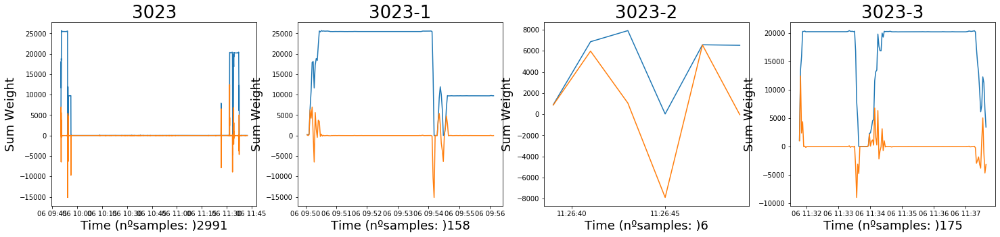

In [204]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

ver=pesagemteste#[80:120]
plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3023', fontsize=26)

ver=boas2.loc[0]#[0:170]
plt.subplot(1, 4, 2)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3023-1', fontsize=26)

ver=boas2.loc[1]#[0:170]
plt.subplot(1, 4, 3)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3023-2', fontsize=26)

ver=boas2.loc[2]#[80:120]
plt.subplot(1, 4, 4)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3023-3', fontsize=26)


##### GENERALIZAR

In [13]:
verdadeiros=filtrado3.set_index('new_measurement')#.drop(['index'],axis=1)

In [14]:
filtrado3.new_measurement.nunique()

2892

In [15]:
new=0
new_data=pd.DataFrame()
for pesagem in filtrado3.new_measurement.unique():#[0:3]:#filtrado3.new_measurement.nunique()):
    pesagemteste=verdadeiros.loc[pesagem]
    teste=pesagemteste.reset_index().reset_index()
    novo=teste[teste.peso < 200].reset_index(drop=True)
    
    if novo.shape[0]>9:
    

        lixo=novo
        for i in range(novo.shape[0]-10):
            if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10:
                   lixo=lixo.drop([i])

        #print(lixo.shape[0])
        lixo2=novo
        for i in range(novo.shape[0]-1,9,-1):
            if novo.iloc[i-10]['index'] != novo.iloc[i]['index']-10:
                   lixo2=lixo2.drop([i])
        #print(lixo2.shape[0])

        real_lixo=pd.concat([lixo.iloc[0:len(lixo)-10],lixo2.iloc[10:len(lixo2)]]).drop_duplicates()
        #print(real_lixo.shape[0])

        boas=teste.loc[~teste.set_index(list(teste.columns)).index.isin(real_lixo.set_index(list(real_lixo.columns)).index)].reset_index(drop=True)

        a=new
        boas['slice_measurement']=new
        for i in range(boas.shape[0]-1):
            if boas.iloc[i+1]['index']!= boas.iloc[i]['index']+1:
                new=new+1
                boas['slice_measurement'][i+1]=new
            else:
                boas['slice_measurement'][i+1]=new

        boas.iloc[-1]['slice_measurement']=new
        new=new+1
    else:
        boas=teste
        boas['slice_measurement']=new
        new=new+1
    
    new_data=new_data.append(boas)
    #new=a
    
    #new=new+1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [40]:
new_data.head()

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,8,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,0
1,1,8,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,0
2,2,8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,0
3,3,8,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,0
4,4,8,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,0


In [16]:
print(filtrado3.new_measurement.nunique())
print(new_data.slice_measurement.nunique())

2892
3080


In [43]:
verdadeiros['index'].nunique()

327519

In [32]:
new_data['index'].nunique()

226507

In [35]:
sobras=verdadeiros.loc[~verdadeiros.set_index('index').index.isin(new_data.set_index('index').index)]

In [44]:
sobras.head()

,index,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,,
36,479,36,0.0,0,2019-05-10 13:45:51,00:00:03,-1870.0
36,489,36,0.0,0,2019-05-10 13:46:48,00:00:03,0.0
127,2436,127,0.0,0,2019-05-14 14:16:43,00:06:15,0.0
127,2437,127,20.0,0,2019-05-14 14:16:46,00:00:03,20.0
127,2438,127,30.0,0,2019-05-14 14:16:49,00:00:03,10.0


Text(0.5, 1.0, 'Sobras')

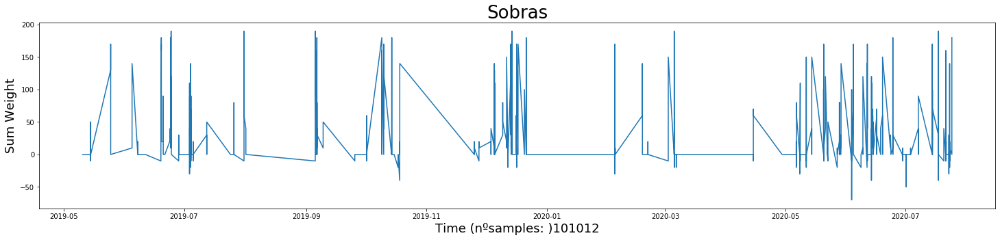

In [41]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

ver=sobras#.set_index('new_measurement').loc[1301]
#plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso']])#,'diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('Sobras', fontsize=26)

## VALIDAR

In [45]:
new_data.groupby('new_measurement').nunique().sort_values(by=['slice_measurement'],ascending=False)

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff,slice_measurement
new_measurement,,,,,,,,,,
1301,600,1,600,24,181,8,600,13,143,24
1723,901,1,901,22,99,9,901,21,70,12
5341,304,1,304,7,93,9,304,12,71,9
2960,833,1,833,7,124,9,833,12,75,9
12947,1084,1,1084,6,126,9,1084,14,83,8
...,...,...,...,...,...,...,...,...,...,...
4079,8,1,8,1,5,2,8,2,6,1
4080,336,1,336,1,40,8,336,6,36,1
4081,311,1,311,1,25,9,311,14,22,1


In [276]:
temp=new_data.set_index('new_measurement').loc[1301]
boas2=temp.set_index('slice_measurement')
boas2

,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,
313,12033,1355,3580.0,0,2019-06-24 04:55:24,00:00:02,3470.0
314,12433,1356,610.0,1,2019-06-24 05:20:04,00:00:02,560.0
314,12434,1356,990.0,0,2019-06-24 05:20:06,00:00:02,380.0
314,12435,1356,3490.0,0,2019-06-24 05:20:08,00:00:02,2500.0
314,12436,1356,3460.0,0,2019-06-24 05:20:10,00:00:02,-30.0
...,...,...,...,...,...,...,...
336,19820,1420,380.0,0,2019-06-24 12:56:38,00:00:02,370.0
336,19821,1420,3150.0,0,2019-06-24 12:56:40,00:00:02,2770.0
336,19822,1420,930.0,0,2019-06-24 12:56:42,00:00:02,-2220.0


In [277]:
temp.groupby('slice_measurement').count()

,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,
313,1,1,1,1,1,1,1
314,5,5,5,5,5,5,5
315,2,2,2,2,2,2,2
316,25,25,25,25,25,25,25
317,3,3,3,3,3,3,3
318,7,7,7,7,7,7,7
319,3,3,3,3,3,3,3
320,1,1,1,1,1,1,1
321,8,8,8,8,8,8,8


Text(0.5, 1.0, '1301-3')

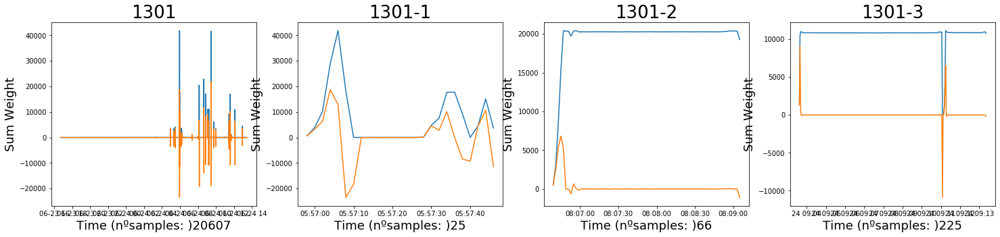

In [283]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

ver=filtrado3.set_index('new_measurement').loc[1301]
plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1301', fontsize=26)





ver=boas2.loc[316]#[0:170]
plt.subplot(1, 4, 2)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1301-1', fontsize=26)

ver=boas2.loc[325]#[0:170]
plt.subplot(1, 4, 3)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1301-2', fontsize=26)

ver=boas2.loc[328]#[80:120]
plt.subplot(1, 4, 4)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1301-3', fontsize=26)

### FILTRAR PELO TAMANHO

In [16]:
DATA_READY=new_data.groupby('slice_measurement').filter(lambda x: len(x) > 5)#.loc[1301]
DATA_READY

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,8,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,0
1,1,8,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,0
2,2,8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,0
3,3,8,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,0
4,4,8,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,0
...,...,...,...,...,...,...,...,...,...,...
1,1,13108,423046,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0,3079
2,2,13108,423047,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0,3079
3,3,13108,423048,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0,3079
4,4,13108,423049,13108,0.0,0,2020-07-24 11:58:02,00:00:02,-10.0,3079


In [18]:
print(new_data.shape[0])
print(DATA_READY.shape[0])

226507
226201


In [47]:
DATA_READY.groupby('slice_measurement').count()

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,,
0,24,24,24,24,24,24,24,24,24
1,12,12,12,12,12,12,12,12,12
2,72,72,72,72,72,72,72,72,72
3,68,68,68,68,68,68,68,68,68
4,22,22,22,22,22,22,22,22,22
...,...,...,...,...,...,...,...,...,...
3075,8,8,8,8,8,8,8,8,8
3076,9,9,9,9,9,9,9,9,9
3077,8,8,8,8,8,8,8,8,8


Text(0.5, 1.0, '3075-3078')

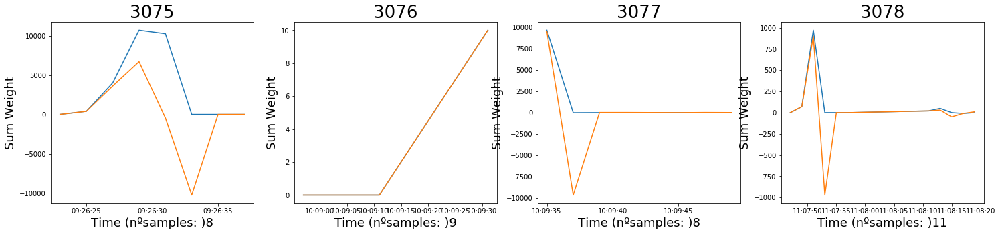

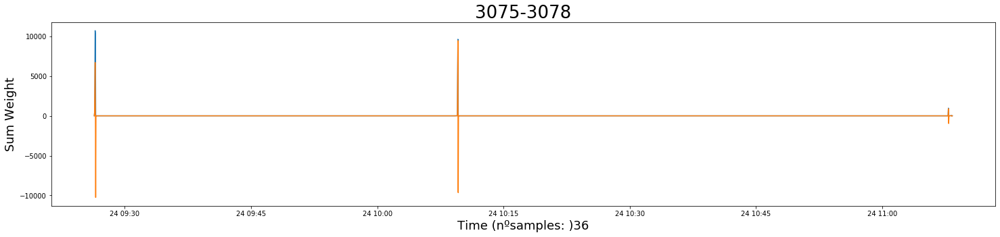

In [57]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

ver=DATA_READY.set_index('slice_measurement').loc[3075]
plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3075', fontsize=26)

ver=DATA_READY.set_index('slice_measurement').loc[3076]
plt.subplot(1, 4, 2)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3076', fontsize=26)

ver=DATA_READY.set_index('slice_measurement').loc[3077]
plt.subplot(1, 4, 3)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3077', fontsize=26)

ver=DATA_READY.set_index('slice_measurement').loc[3078]
plt.subplot(1, 4, 4)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3078', fontsize=26)

fig = plt.figure(figsize=(25,5))

ver=DATA_READY.set_index('slice_measurement').loc[3075:3078]
#plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3075-3078', fontsize=26)


In [59]:
verdadeiros.loc[13101]

,index,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,,
13101,422995,13101,0.0,0,2020-07-24 10:08:55,00:04:04,0.0
13101,422996,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0
13101,422997,13101,0.0,0,2020-07-24 10:08:59,00:00:02,0.0
13101,422998,13101,0.0,0,2020-07-24 10:09:01,00:00:02,0.0
13101,422999,13101,0.0,0,2020-07-24 10:09:03,00:00:02,0.0
13101,423000,13101,0.0,0,2020-07-24 10:09:05,00:00:02,0.0
13101,423001,13101,0.0,4,2020-07-24 10:09:07,00:00:02,0.0
13101,423002,13101,0.0,6,2020-07-24 10:09:09,00:00:02,0.0
13101,423003,13101,0.0,6,2020-07-24 10:09:11,00:00:02,0.0


In [50]:
DATA_READY.set_index('slice_measurement').loc[3075:3079]

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,,
3075,0,13099,422984,13099,0.0,0,2020-07-24 09:26:23,00:01:48,0.0
3075,1,13099,422985,13099,390.0,0,2020-07-24 09:26:25,00:00:02,390.0
3075,2,13099,422986,13099,4000.0,0,2020-07-24 09:26:27,00:00:02,3610.0
3075,3,13099,422987,13099,10700.0,0,2020-07-24 09:26:29,00:00:02,6700.0
3075,4,13099,422988,13099,10250.0,0,2020-07-24 09:26:31,00:00:02,-450.0
3075,5,13099,422989,13099,0.0,0,2020-07-24 09:26:33,00:00:02,-10250.0
3075,6,13099,422990,13099,0.0,0,2020-07-24 09:26:35,00:00:02,0.0
3075,7,13099,422991,13099,0.0,1,2020-07-24 09:26:37,00:00:02,0.0
3076,1,13101,422996,13101,0.0,0,2020-07-24 10:08:57,00:00:02,0.0


In [290]:
new_data.shape

(226507, 9)

### CLUSTERS

In [41]:
DATA_READY=new_data
DATA_READY

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,8,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,0
1,1,8,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,0
2,2,8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,0
3,3,8,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,0
4,4,8,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,0
...,...,...,...,...,...,...,...,...,...,...
1,1,13108,423046,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0,3079
2,2,13108,423047,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0,3079
3,3,13108,423048,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0,3079
4,4,13108,423049,13108,0.0,0,2020-07-24 11:58:02,00:00:02,-10.0,3079


In [44]:
DATA_READY.groupby('slice_measurement').count().sort_values(by='index')#,ascending=False)#.min()

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,,
3079,6,6,6,6,6,6,6,6,6
1867,6,6,6,6,6,6,6,6,6
1007,6,6,6,6,6,6,6,6,6
39,6,6,6,6,6,6,6,6,6
937,6,6,6,6,6,6,6,6,6
...,...,...,...,...,...,...,...,...,...
2371,1387,1387,1387,1387,1387,1387,1387,1387,1387
2107,1415,1415,1415,1415,1415,1415,1415,1415,1415
782,1647,1647,1647,1647,1647,1647,1647,1647,1647


In [27]:
DATA_READY.set_index('slice_measurement').loc[418]

level_0                             22
new_measurement                     70
index                              972
measurement                         70
peso                             20180
0                                    7
timestamp          2019-05-13 11:56:14
period                 0 days 00:00:03
diff                                 0
Name: 11, dtype: object

In [31]:
DATA_READY.set_index('slice_measurement').loc[417]

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,,
417,635,1836,67977,1847,20.0,7,2019-07-04 11:09:02,00:00:03,10.0
417,636,1836,67978,1847,10.0,0,2019-07-04 11:09:05,00:00:03,-10.0
417,637,1836,67979,1848,10.0,7,2019-07-04 11:14:07,00:05:02,0.0
417,638,1836,67980,1848,10.0,7,2019-07-04 11:14:28,00:00:21,0.0
417,639,1836,67981,1848,10.0,7,2019-07-04 11:14:31,00:00:03,0.0


In [30]:
DATA_READY.set_index('new_measurement').loc[70]

,level_0,index,measurement,peso,0,timestamp,period,diff,slice_measurement
new_measurement,,,,,,,,,
70,0,950,70,0.0,0,2019-05-13 11:55:08,00:05:24,0.0,11
70,1,951,70,0.0,0,2019-05-13 11:55:11,00:00:03,0.0,11
70,2,952,70,0.0,0,2019-05-13 11:55:14,00:00:03,0.0,11
70,3,953,70,0.0,0,2019-05-13 11:55:17,00:00:03,0.0,11
70,4,954,70,440.0,0,2019-05-13 11:55:20,00:00:03,440.0,11
70,5,955,70,16470.0,0,2019-05-13 11:55:23,00:00:03,16030.0,11
70,6,956,70,20250.0,0,2019-05-13 11:55:26,00:00:03,3780.0,11
70,7,957,70,20630.0,2,2019-05-13 11:55:29,00:00:03,380.0,11
70,8,958,70,20230.0,0,2019-05-13 11:55:32,00:00:03,-400.0,11


In [28]:
DATA_READY.set_index('slice_measurement').loc[419]

level_0                            116
new_measurement                   1853
index                            68500
measurement                       1853
peso                               650
0                                    0
timestamp          2019-07-04 11:58:07
period                 0 days 00:00:03
diff                               650
Name: 419, dtype: object

Text(0.5, 1.0, '3075-3078')

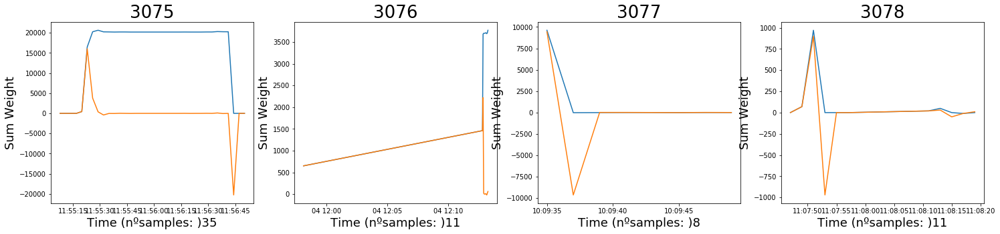

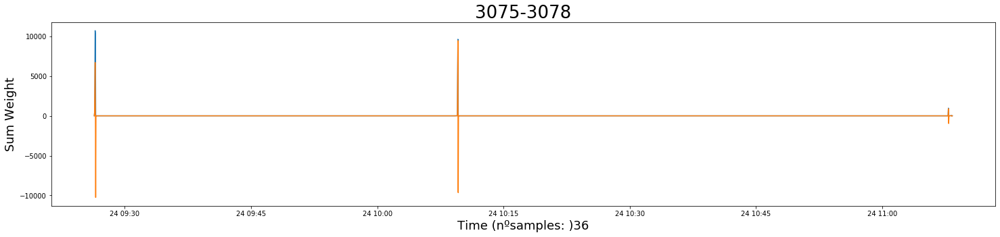

In [29]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

ver=DATA_READY.set_index('new_measurement').loc[70]
plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3075', fontsize=26)

ver=DATA_READY.set_index('new_measurement').loc[1853]
plt.subplot(1, 4, 2)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3076', fontsize=26)

ver=DATA_READY.set_index('slice_measurement').loc[3077]
plt.subplot(1, 4, 3)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3077', fontsize=26)

ver=DATA_READY.set_index('slice_measurement').loc[3078]
plt.subplot(1, 4, 4)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3078', fontsize=26)

fig = plt.figure(figsize=(25,5))

ver=DATA_READY.set_index('slice_measurement').loc[3075:3078]
#plt.subplot(1, 4, 1)
plt.plot(ver.timestamp, ver[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(ver.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3075-3078', fontsize=26)


In [83]:
DATA_READY

,level_0,new_measurement,index,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,8,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,0
1,1,8,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,0
2,2,8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,0
3,3,8,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,0
4,4,8,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,0
...,...,...,...,...,...,...,...,...,...,...
1,1,13108,423046,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0,3079
2,2,13108,423047,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0,3079
3,3,13108,423048,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0,3079
4,4,13108,423049,13108,0.0,0,2020-07-24 11:58:02,00:00:02,-10.0,3079


In [48]:
DATA_READY.slice_measurement.nunique()

2983

In [17]:
forcluster=DATA_READY.groupby('slice_measurement')['diff'].mean().to_frame().rename(columns={"diff": "mean"})

forcluster['std']=DATA_READY.groupby('slice_measurement')['diff'].std()
forcluster['meanpeso']=DATA_READY.groupby('slice_measurement')['peso'].mean()
forcluster['stdpeso']=DATA_READY.groupby('slice_measurement')['peso'].std()

forcluster['max']=DATA_READY.groupby('slice_measurement')['peso'].max()
forcluster['min']=DATA_READY.groupby('slice_measurement')['peso'].min()

forcluster['mediandiff']=DATA_READY.groupby('slice_measurement')['diff'].median()
forcluster['medianpeso']=DATA_READY.groupby('slice_measurement')['peso'].median()

forcluster['counts']=DATA_READY.groupby('slice_measurement')['peso'].count()#['peso'].min()

forcluster

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts
slice_measurement,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22
...,...,...,...,...,...,...,...,...,...
3075,0.000000,4830.545666,3167.500000,4712.296225,10700.0,0.0,0.0,195.0,8
3076,1.111111,3.333333,1.111111,3.333333,10.0,0.0,0.0,0.0,9
3077,-22.500000,5099.573512,1197.500000,3403.211718,9620.0,-20.0,5.0,0.0,8


In [18]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
from sklearn import datasets

#X = Y #dataFinal
#KMeans
km = KMeans(n_clusters=3)
km.fit(forcluster) #forcluster
km.predict(forcluster) #forcluster
labels = km.labels_

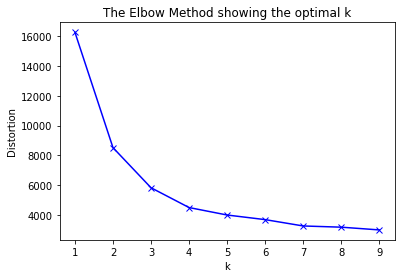

In [19]:
from scipy.spatial.distance import cdist
distortions = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k).fit(forcluster)
    km.fit(forcluster)
    distortions.append(sum(np.min(cdist(forcluster, km.cluster_centers_, 'euclidean'), axis=1)) / forcluster.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [50]:
forcluster.columns

Index(['mean', 'std', 'meanpeso', 'stdpeso', 'max', 'min', 'mediandiff',
       'medianpeso', 'counts'],
      dtype='object')

In [49]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

X=forcluster #forcluster

trace = go.Scatter3d(
    x= X.values[:, 8],  
    y= X.values[:, 7],
    z= X.values[:, 0],  
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': labels,
    }
)

layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [101]:
forcluster.columns

Index(['mean', 'std', 'meanpeso', 'stdpeso', 'max', 'min', 'mediandiff',
       'medianpeso', 'counts', 'Kmeans_label'],
      dtype='object')

In [106]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

X=forcluster #forcluster

trace = go.Scatter3d(
    x= X.values[:, 2],  
    y= X.values[:, 1],
    z= X.values[:, 0],  
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': labels,
    }
)

layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [20]:
forcluster['Kmeans_label']=labels#.value_counts()
forcluster['Kmeans_label'].value_counts()

0    1649
1    1056
2     278
Name: Kmeans_label, dtype: int64

In [26]:
res=km.__dict__
pd.DataFrame(res['cluster_centers_'].T, columns=['centroid0','centroid1']).set_index(forcluster.columns[:-1])

,centroid0,centroid1
mean,8.346107,14.435171
std,1739.579184,2770.012674
meanpeso,3108.060477,21332.082955
stdpeso,2065.407007,7348.901636
max,6155.890547,25777.009250
min,5.388060,46.084275
mediandiff,12.572139,0.714286
medianpeso,2787.243781,24221.849949
counts,32.360697,165.627955


In [37]:
res=km.__dict__
pd.DataFrame(res['cluster_centers_'].T, columns=['centroid0','centroid1','centroid2']).set_index(forcluster.columns)

ValueError: Shape of passed values is (9, 9), indices imply (9, 3)

In [21]:
class0=forcluster[forcluster['Kmeans_label']==0]
class0.sort_values(by=['counts'],ascending=False).head()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
1506,0.01328,5.936260,282.456839,57.238708,370.0,190.0,0.0,290.0,753,0
1361,0.00000,384.289423,6325.515548,1160.217979,9730.0,0.0,0.0,6360.0,611,0
661,0.00000,159.835442,2073.760504,290.170798,2730.0,0.0,0.0,2040.0,476,0
2215,0.00000,352.196881,3588.023952,701.699130,5940.0,0.0,0.0,3780.0,334,0
2896,0.00000,758.219568,6918.276923,2334.789119,8510.0,-10.0,0.0,8370.0,325,0


In [22]:
class1=forcluster[forcluster['Kmeans_label']==1]
class1.sort_values(by=['counts'],ascending=False).head()#.counts.max()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
782,0.0,852.038439,16812.106861,4102.161582,28410.0,-10.0,0.0,15750.0,1647,1
2107,0.0,344.245891,9844.098940,570.432245,9940.0,0.0,0.0,9890.0,1415,1
845,0.0,586.185120,16718.447761,1874.025228,17100.0,0.0,0.0,16990.0,1340,1
447,0.0,866.780837,26191.442006,1936.585057,26510.0,-10.0,0.0,26350.0,1276,1
2074,0.0,529.449449,16504.728132,1079.161606,16610.0,-10.0,0.0,16580.0,1269,1


In [23]:
class2=forcluster[forcluster['Kmeans_label']==2]
class2.sort_values(by=['counts'],ascending=False).head()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
3043,0.000000,1208.896261,38080.252193,12896.327514,45270.0,-40.0,0.0,45030.0,1824,2
2339,0.000000,769.094716,35755.134680,5107.895020,36900.0,-50.0,0.0,36780.0,1782,2
2371,-0.007210,1553.072062,43074.931507,7325.340561,45150.0,-40.0,0.0,44510.0,1387,2
1296,-0.007722,1232.936424,18180.478764,7103.561023,45070.0,0.0,0.0,16650.0,1295,2
721,0.000000,1204.998624,34545.366667,11893.594257,44320.0,0.0,0.0,43130.0,1200,2


In [25]:
DATA_READY2=DATA_READY.set_index('slice_measurement')

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, '2371')

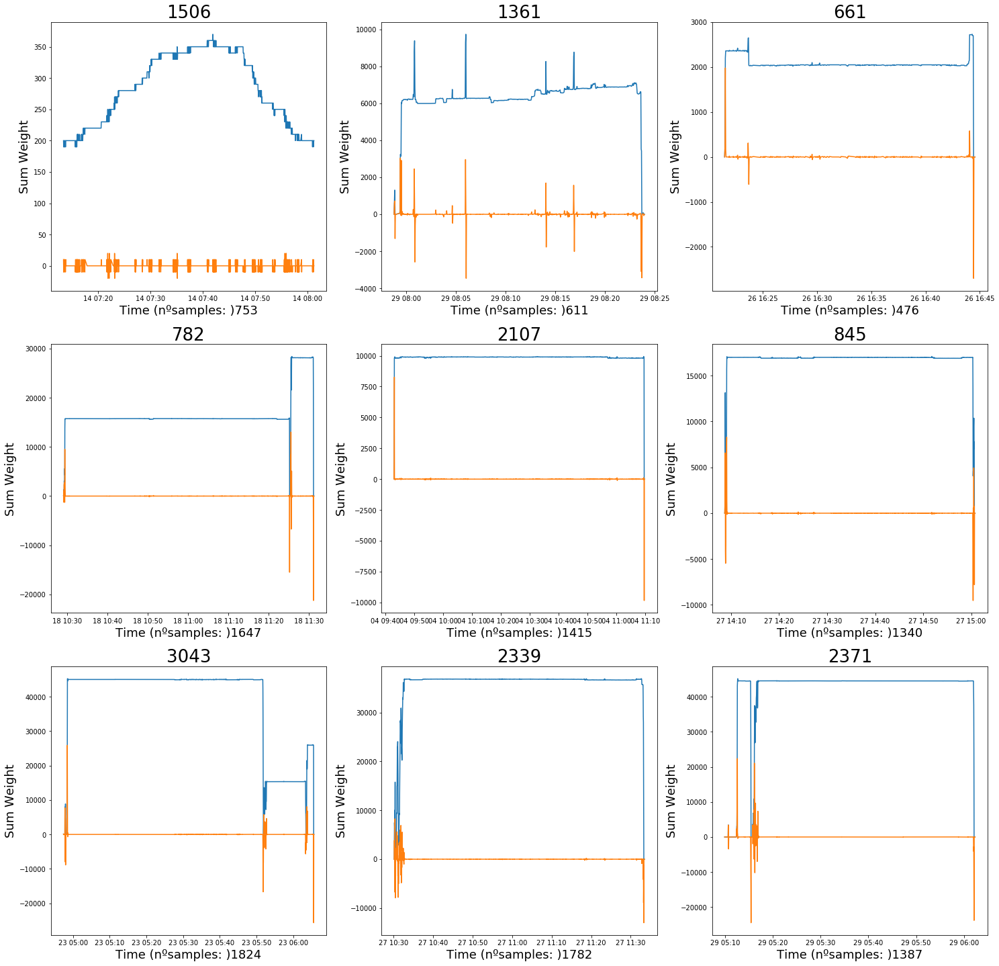

In [26]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,25))


teste=DATA_READY2.loc[1506]
plt.subplot(3, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1506', fontsize=26)

teste=DATA_READY2.loc[1361]
plt.subplot(3, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1361', fontsize=26)

teste=DATA_READY2.loc[661]
plt.subplot(3, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('661', fontsize=26)


teste=DATA_READY2.loc[782]
plt.subplot(3, 3, 4)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('782', fontsize=26)

teste=DATA_READY2.loc[2107]
plt.subplot(3, 3, 5)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2107', fontsize=26)

teste=DATA_READY2.loc[845]
plt.subplot(3, 3, 6)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('845', fontsize=26)


teste=DATA_READY2.loc[3043]
plt.subplot(3, 3, 7)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3043', fontsize=26)

teste=DATA_READY2.loc[2339]
plt.subplot(3, 3, 8)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2339', fontsize=26)

teste=DATA_READY2.loc[2371]
plt.subplot(3, 3, 9)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2371', fontsize=26)

Text(0.5, 1.0, '782')

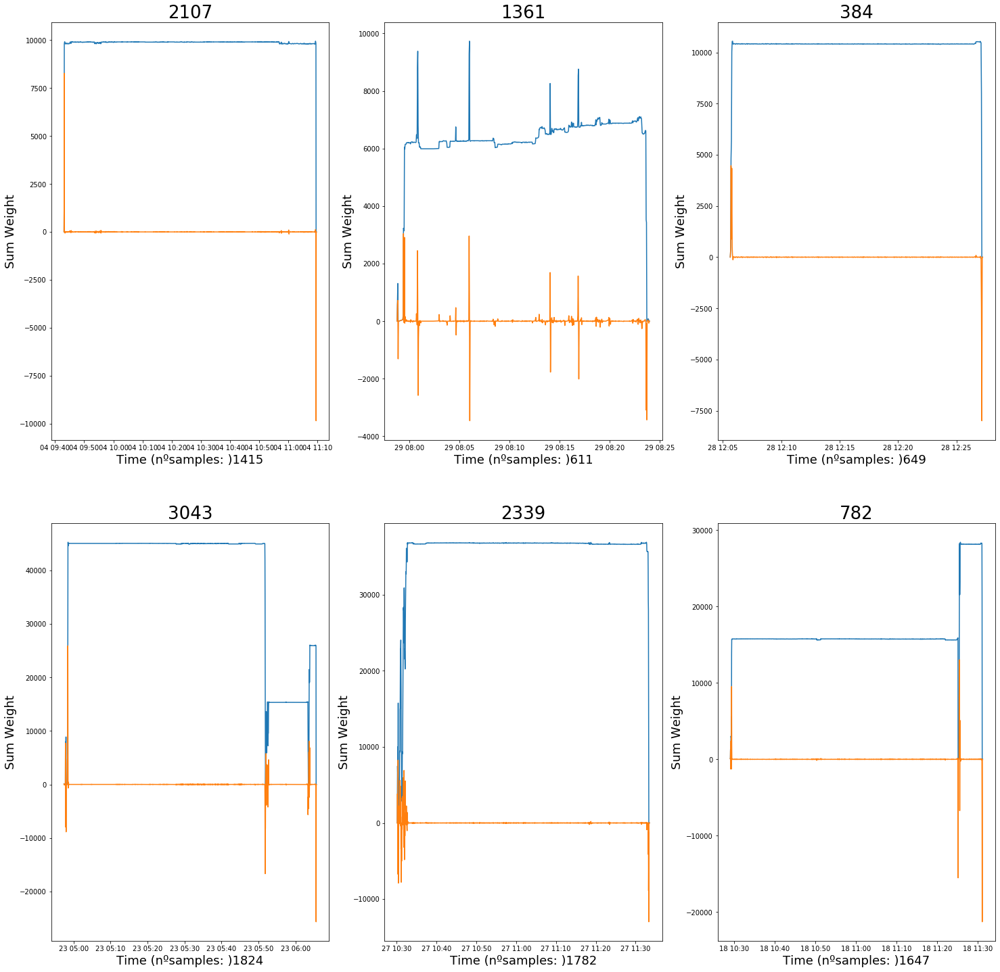

In [61]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,25))


teste=DATA_READY2.loc[2107]
plt.subplot(2, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2107', fontsize=26)

teste=DATA_READY2.loc[1361]
plt.subplot(2, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1361', fontsize=26)

teste=DATA_READY2.loc[384]
plt.subplot(2, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('384', fontsize=26)


teste=DATA_READY2.loc[3043]
plt.subplot(2, 3, 4)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3043', fontsize=26)

teste=DATA_READY2.loc[2339]
plt.subplot(2, 3, 5)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2339', fontsize=26)

teste=DATA_READY2.loc[782]
plt.subplot(2, 3, 6)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('782', fontsize=26)

In [115]:
forcluster.to_csv('filtered_3x_3clusters.csv')

In [29]:
forcluster.to_csv('filtered_3x_2clusters.csv')

## Random Forest

In [42]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [30]:
# Pandas is used for data manipulation
import pandas as pd
# Read in data and display first 5 rows
dados=pd.read_csv('filtered_3x_2clusters.csv').set_index('slice_measurement')

In [43]:
dados=forcluster

In [44]:
dados.head()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,0
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12,1
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,2
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68,0
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22,2


In [33]:
dados.head()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12,0
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,1
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68,1
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22,1


In [137]:
dados.dtypes

mean            float64
std             float64
meanpeso        float64
stdpeso         float64
max             float64
min             float64
mediandiff      float64
medianpeso      float64
counts            int64
Kmeans_label      int32
dtype: object

In [45]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit_transform(dados['Kmeans_label'])
le.classes_

#le.transform([1, 1, 2, 6])

array([0, 1, 2], dtype=int32)

In [49]:
dados

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,0
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12,1
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,2
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68,0
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22,2
...,...,...,...,...,...,...,...,...,...,...
3075,0.000000,4830.545666,3167.500000,4712.296225,10700.0,0.0,0.0,195.0,8,1
3076,1.111111,3.333333,1.111111,3.333333,10.0,0.0,0.0,0.0,9,1
3077,-22.500000,5099.573512,1197.500000,3403.211718,9620.0,-20.0,5.0,0.0,8,1


In [53]:
dados2 =pd.concat([dados.iloc[:,:-1], pd.get_dummies(dados['Kmeans_label'])], axis=1, sort=False)
dados2

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,0,1,2
slice_measurement,,,,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1,0,0
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12,0,1,0
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,0,0,1
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68,1,0,0
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3075,0.000000,4830.545666,3167.500000,4712.296225,10700.0,0.0,0.0,195.0,8,0,1,0
3076,1.111111,3.333333,1.111111,3.333333,10.0,0.0,0.0,0.0,9,0,1,0
3077,-22.500000,5099.573512,1197.500000,3403.211718,9620.0,-20.0,5.0,0.0,8,0,1,0


In [46]:
y_train

array([0, 0, 1, ..., 0, 0, 0], dtype=int32)

In [144]:
dados.dtypes

mean            float64
std             float64
meanpeso        float64
stdpeso         float64
max             float64
min             float64
mediandiff      float64
medianpeso      float64
counts            int64
Kmeans_label      int32
dtype: object

In [46]:
X = dados.iloc[:, :-1].values
y = dados.iloc[:, 9].values
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [36]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(X_train, y_train);

In [37]:
#print(rf.feature_importances_)
pd.DataFrame([dados.columns,rf.feature_importances_]).T

,0,1
0,mean,0.00056833
1,std,0.000693753
2,meanpeso,0.0946728
3,stdpeso,0.0009389
4,max,0.019581
5,min,0.000460168
6,mediandiff,2.52392e-05
7,medianpeso,0.882734
8,counts,0.000326023
9,Kmeans_label,None


In [219]:
#print(rf.feature_importances_)
pd.DataFrame(rf.feature_importances_, columns=['Importance']).set_index(dados.columns[:-1])

,Importance
mean,0.000338
std,0.001425
meanpeso,0.574061
stdpeso,0.002174
max,0.046374
min,0.000252
mediandiff,0.000230
medianpeso,0.374449
counts,0.000697


In [200]:
rf.feature_importances_

array([3.37965863e-04, 1.42529485e-03, 5.74061235e-01, 2.17353677e-03,
       4.63740674e-02, 2.51899101e-04, 2.30149745e-04, 3.74448807e-01,
       6.97044416e-04])

In [38]:
y_pred = np.round(rf.predict(X_test))

In [39]:
y_pred

array([0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 1., 0., 1., 0., 0., 0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 0.,
       1., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 0., 0., 0., 1., 1.,
       0., 1., 1., 1., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 1., 0.,
       1., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 1.,
       0., 1., 1., 0., 0.

In [165]:
tree = rf.estimators_[5]
tree

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=1201263687, splitter='best')

In [40]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = rf.estimators_[5]
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = rf.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = dados.columns[:-1], rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
#graph.write_png('tree.png')

In [56]:
from sklearn import tree
tree.export_graphviz(estimator)


'digraph Tree {\nnode [shape=box] ;\n0 [label="X[7] <= 14375.0\\nmse = 0.223\\nsamples = 1529\\nvalue = 0.336"] ;\n1 [label="X[4] <= 17130.0\\nmse = 0.015\\nsamples = 1022\\nvalue = 0.015"] ;\n0 -> 1 [labeldistance=2.5, labelangle=45, headlabel="True"] ;\n2 [label="mse = 0.0\\nsamples = 994\\nvalue = 0.0"] ;\n1 -> 2 ;\n3 [label="X[2] <= 9454.131\\nmse = 0.25\\nsamples = 28\\nvalue = 0.5"] ;\n1 -> 3 ;\n4 [label="mse = 0.0\\nsamples = 14\\nvalue = 0.0"] ;\n3 -> 4 ;\n5 [label="mse = 0.0\\nsamples = 14\\nvalue = 1.0"] ;\n3 -> 5 ;\n6 [label="X[4] <= 14600.0\\nmse = 0.004\\nsamples = 507\\nvalue = 0.996"] ;\n0 -> 6 [labeldistance=2.5, labelangle=-45, headlabel="False"] ;\n7 [label="X[7] <= 14460.0\\nmse = 0.222\\nsamples = 2\\nvalue = 0.333"] ;\n6 -> 7 ;\n8 [label="mse = 0.0\\nsamples = 1\\nvalue = 0.0"] ;\n7 -> 8 ;\n9 [label="mse = 0.0\\nsamples = 1\\nvalue = 1.0"] ;\n7 -> 9 ;\n10 [label="X[2] <= 10956.469\\nmse = 0.001\\nsamples = 505\\nvalue = 0.999"] ;\n6 -> 10 ;\n11 [label="X[1] <= 1793

In [43]:
estimator = rf.estimators_[5]
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = dados.columns[:-1],
                class_names = dados.columns[-1],
                rounded = True, proportion = False, 
                precision = 2, filled = True)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

FileNotFoundError: [Errno 2] No such file or directory: 'dot': 'dot'

In [172]:
# Limit depth of tree to 3 levels
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(X_train, y_train)
# Extract the small tree
tree_small = rf_small.estimators_[5]
# Save the tree as a png image
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = dados.columns[:-1], rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
#graph.write_png('small_tree.png');

In [162]:
dados.columns[:-1]

Index(['mean', 'std', 'meanpeso', 'stdpeso', 'max', 'min', 'mediandiff',
       'medianpeso', 'counts'],
      dtype='object')

In [41]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, roc_auc_score, roc_curve, f1_score
accuracy_score(y_test, y_pred)

0.9966499162479062

In [42]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[415   0]
 [  2 180]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       415
           1       1.00      0.99      0.99       182

    accuracy                           1.00       597
   macro avg       1.00      0.99      1.00       597
weighted avg       1.00      1.00      1.00       597



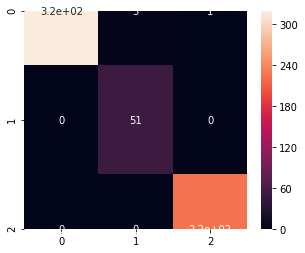

In [155]:
import seaborn as sns
fig = plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True)

Text(33.0, 0.5, 'True')

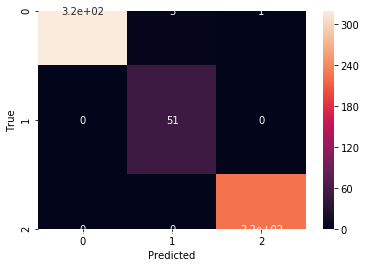

In [157]:
cm= confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('True')

In [121]:
# Use the forest's predict method on the test data
predictions = rf.predict(X_test)
# Calculate the absolute errors
errors = abs(predictions - y_test)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')


Mean Absolute Error: 0.02 degrees.


In [122]:
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')


Accuracy: nan %.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

divide by zero encountered in true_divide

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in true_divide



In [ ]:
# The baseline predictions are the historical averages
baseline_preds = y_test[:, feature_list.index('average')]
# Baseline errors, and display average baseline error
baseline_errors = abs(baseline_preds - test_labels)
print('Average baseline error: ', round(np.mean(baseline_errors), 2))
Average baseline error:  5.06 degrees.

In [ ]:
# One-hot encode the data using pandas get_dummies
features = pd.get_dummies(features)
# Display the first 5 rows of the last 12 columns
features.iloc[:,5:].head(5)

## AutoML

In [27]:
import h2o
h2o.init()
from h2o.automl import H2OAutoML

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,50 days 0 hours 27 mins
H2O cluster timezone:,Europe/Lisbon
H2O data parsing timezone:,UTC
H2O cluster version:,3.28.0.1
H2O cluster version age:,10 months and 24 days !!!
H2O cluster name:,H2O_from_python_root_u0rl90
H2O cluster total nodes:,1
H2O cluster free memory:,13.39 Gb
H2O cluster total cores:,16
H2O cluster allowed cores:,16
H2O cluster status:,"locked, healthy"


In [28]:
forcluster

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
slice_measurement,,,,,,,,,,
0,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
1,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12,0
2,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,2
3,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68,1
4,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22,2
...,...,...,...,...,...,...,...,...,...,...
3075,0.000000,4830.545666,3167.500000,4712.296225,10700.0,0.0,0.0,195.0,8,0
3076,1.111111,3.333333,1.111111,3.333333,10.0,0.0,0.0,0.0,9,0
3077,-22.500000,5099.573512,1197.500000,3403.211718,9620.0,-20.0,5.0,0.0,8,0


In [29]:
dados=forcluster

In [30]:

dadosH2O = h2o.H2OFrame(dados.reset_index())
#dadosH2O.set_names(feature_names.tolist())
#dadosH2O['Fraud_type'] = h2o.H2OFrame(labels_test)
dadosH2O['Kmeans_label'] = dadosH2O['Kmeans_label'].asfactor()

#train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data[:,0:11], labels, train_size=0.80,random_state=20)
#feature_names = range_subset_agg.columns[0:11]#[0:10]

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [31]:
train,test,valid = dadosH2O.split_frame(ratios=[.7, .15])

In [71]:
print(train.shape)
print(test.shape)
print(valid.shape)

(2095, 11)
(424, 11)
(464, 11)


In [69]:
train.columns

['slice_measurement',
 'mean',
 'std',
 'meanpeso',
 'stdpeso',
 'max',
 'min',
 'mediandiff',
 'medianpeso',
 'counts',
 'Kmeans_label']

In [32]:
aml = H2OAutoML(max_models=6, seed = 1, max_runtime_secs = 3600, stopping_rounds=2)#, balance_classes = True, class_sampling_factors = sample_factors)#, stopping_metric='AUC')
aml.train(x = train.columns, y = 'Kmeans_label', training_frame = train) #train_h2o_df

lb = aml.leaderboard

AutoML progress: |████████████████████████████████████████████████████████| 100%


In [33]:
lb

model_id,mean_per_class_error,logloss,rmse,mse
GLM_1_AutoML_20201110_093541,0.0074404,0.0261702,0.0834203,0.00695895
DRF_1_AutoML_20201110_093541,0.00822392,0.0194718,0.0731506,0.00535101
GBM_1_AutoML_20201110_093541,0.00869341,0.0455902,0.0789487,0.0062329
StackedEnsemble_BestOfFamily_AutoML_20201110_093541,0.00977497,0.015162,0.0625697,0.00391496
StackedEnsemble_AllModels_AutoML_20201110_093541,0.00977497,0.0159088,0.0649005,0.00421208
XGBoost_1_AutoML_20201110_093541,0.0104295,0.0203199,0.0722566,0.00522102
XGBoost_3_AutoML_20201110_093541,0.0114678,0.0790179,0.100134,0.0100268
XGBoost_2_AutoML_20201110_093541,0.0171024,0.0780586,0.108774,0.0118319


In [34]:
aml.leader

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_1_AutoML_20201110_093541


GLM Model: summary


,,family,link,regularization,lambda_search,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,multinomial,multinomial,Ridge ( lambda = 6.588E-5 ),"nlambda = 30, lambda.max = 40.912, lambda.min = 6.588E-5, lambda.1...",33,30,100,automl_training_py_4_sid_abb4




ModelMetricsMultinomialGLM: glm
** Reported on train data. **

MSE: 0.004374841258387717
RMSE: 0.06614258279193304

ModelMetricsMultinomialGLM: glm
** Reported on cross-validation data. **

MSE: 0.006958953814181989
RMSE: 0.08342034412648984

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.992288,0.0062359585,0.9855422,0.9855422,0.9951807,0.99759036,0.9975845
1,err,0.0077120075,0.0062359585,0.014457831,0.014457831,0.004819277,0.0024096386,0.002415459
2,err_count,3.2,2.588436,6.0,6.0,2.0,1.0,1.0
3,logloss,0.022873987,0.006843423,0.0306255,0.02935006,0.020509003,0.014780457,0.019104913
4,max_per_class_error,0.019468252,0.017450958,0.027777778,0.046511628,0.008403362,0.007751938,0.0068965517
5,mean_per_class_accuracy,0.99055934,0.009578927,0.98268527,0.97779536,0.9971989,0.997416,0.99770117
6,mean_per_class_error,0.009440665,0.009578927,0.017314717,0.022204656,0.0028011205,0.0025839794,0.0022988506
7,mse,0.0061604907,0.0027414146,0.0096192425,0.008482326,0.0051730317,0.0034136262,0.004114228
8,null_deviance,755.5735,20.022602,755.851,774.0833,745.4406,774.919,727.5734
9,r2,0.98574317,0.006347913,0.97721094,0.98132837,0.9877798,0.9928151,0.9895817



Scoring History: 


,,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test,deviance_xval,deviance_se
0,,2020-11-10 09:35:54,0.000 sec,2,.41E2,32,1.773465,NaN,1.784129,0.019973
1,,2020-11-10 09:35:54,0.010 sec,4,.25E2,33,1.747561,NaN,1.762951,0.019508
2,,2020-11-10 09:35:54,0.020 sec,6,.16E2,33,1.709093,NaN,1.730857,0.018750
3,,2020-11-10 09:35:54,0.030 sec,8,.98E1,33,1.654068,NaN,1.684142,0.017664
4,,2020-11-10 09:35:54,0.039 sec,10,.61E1,33,1.579532,NaN,1.619041,0.016187
5,,2020-11-10 09:35:54,0.054 sec,13,.38E1,33,1.484123,NaN,1.533736,0.014336
6,,2020-11-10 09:35:54,0.068 sec,16,.23E1,33,1.370906,NaN,1.428247,0.012284
7,,2020-11-10 09:35:54,0.082 sec,19,.15E1,33,1.244331,NaN,1.307389,0.010315
8,,2020-11-10 09:35:54,0.096 sec,22,.91E0,33,1.110413,NaN,1.176304,0.008958
9,,2020-11-10 09:35:54,0.111 sec,25,.56E0,33,0.975155,NaN,1.041316,0.008384



See the whole table with table.as_data_frame()


In [35]:
nd = h2o.get_model('DRF_1_AutoML_20201110_093541')
nd

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_1_AutoML_20201110_093541


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,27.0,81.0,20242.0,3.0,11.0,6.728395,5.0,31.0,15.222222




ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.004270866039716105
RMSE: 0.06535186332244938
LogLoss: 0.014858899328547316
Mean Per-Class Error: 0.006302743461146096

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,Error,Rate
0,1167.0,5.0,0.0,0.004266,"5 / 1,172"
1,3.0,707.0,0.0,0.004225,3 / 710
2,0.0,2.0,190.0,0.010417,2 / 192
3,1170.0,714.0,190.0,0.004822,"10 / 2,074"



Top-3 Hit Ratios: 


,k,hit_ratio
0,1,0.995178
1,2,1.000000
2,3,1.000000



ModelMetricsMultinomial: drf
** Reported on cross-validation data. **

MSE: 0.00535100673109742
RMSE: 0.07315057574002695
LogLoss: 0.019471839480317246
Mean Per-Class Error: 0.00822392403339262

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,Error,Rate
0,1168.0,4.0,0.0,0.003413,"4 / 1,172"
1,4.0,706.0,0.0,0.005634,4 / 710
2,0.0,3.0,189.0,0.015625,3 / 192
3,1172.0,713.0,189.0,0.005304,"11 / 2,074"



Top-3 Hit Ratios: 


,k,hit_ratio
0,1,0.994696
1,2,1.000000
2,3,1.000000



Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.9946953,0.0031444712,0.9927711,0.9927711,1.0,0.9951807,0.9927536
1,err,0.005304697,0.0031444712,0.0072289156,0.0072289156,0.0,0.004819277,0.007246377
2,err_count,2.2,1.3038405,3.0,3.0,0.0,2.0,3.0
3,logloss,0.019473264,0.0047919783,0.020655649,0.023376852,0.011319831,0.019586947,0.022427041
4,max_per_class_error,0.018070651,0.017681058,0.00877193,0.046511628,0.0,0.021276595,0.013793103
5,mean_per_class_accuracy,0.99244684,0.0062939837,0.9948685,0.98303413,1.0,0.99032384,0.9940076
6,mean_per_class_error,0.0075531853,0.0062939837,0.005131482,0.016965864,0.0,0.009676178,0.0059924014
7,mse,0.005351603,0.0019769943,0.0055426746,0.0072518387,0.0021194008,0.0052554663,0.0065886355
8,r2,0.98763067,0.0046912762,0.9868688,0.984037,0.9949934,0.98893845,0.9833159
9,rmse,0.07186177,0.015308899,0.07444914,0.08515773,0.04603695,0.072494596,0.08117041



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_classification_error
0,,2020-11-10 09:35:55,0.399 sec,0.0,NaN,NaN,NaN
1,,2020-11-10 09:35:55,0.432 sec,5.0,0.089235,0.189724,0.011058
2,,2020-11-10 09:35:55,0.472 sec,10.0,0.078322,0.080016,0.009219
3,,2020-11-10 09:35:55,0.502 sec,15.0,0.070980,0.015851,0.007239
4,,2020-11-10 09:35:55,0.517 sec,20.0,0.069347,0.015711,0.006750
5,,2020-11-10 09:35:55,0.541 sec,25.0,0.065668,0.014874,0.005304
6,,2020-11-10 09:35:55,0.564 sec,27.0,0.065352,0.014859,0.004822



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,medianpeso,7589.995117,1.000000,0.276807
1,meanpeso,7209.779297,0.949906,0.262940
2,max,5474.191895,0.721238,0.199644
3,counts,5262.898926,0.693400,0.191938
4,stdpeso,1494.627319,0.196921,0.054509
5,std,308.833984,0.040690,0.011263
6,slice_measurement,50.739304,0.006685,0.001850
7,mediandiff,16.192434,0.002133,0.000591
8,min,11.764758,0.001550,0.000429
9,mean,0.797794,0.000105,0.000029


In [74]:
aml.leader

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_AutoML_20201104_101451

No model summary for this model

ModelMetricsMultinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.0012414745592409565
RMSE: 0.035234564836832544

ModelMetricsMultinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.006214226262039929
RMSE: 0.07883036383297953


In [62]:
dadosH2O

slice_measurement,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
0,909.583,4568.73,19863.3,6089.31,22040,0,0,21830,24,0
1,0,824.919,762.5,1035.46,2180,0,0,30,12,1
2,0,4135.71,27892.6,8326.25,31520,0,0,30480,72,2
3,0,3728.74,20529.3,6865.13,23080,0,0,22810,68,0
4,1896.82,5799.83,23229.1,15733,41800,40,180,18620,22,2
5,0,2377.85,10588.6,4392.52,12580,-20,0,12440,44,0
6,0,3245.22,21265.4,8776.42,25440,0,0,25320,46,0
7,0,1898.24,9491.49,3344.98,10820,-10,0,10730,47,0
9,0,5,1.11111,3.33333,10,0,0,0,9,1
10,0,2752.97,14781.4,5536.28,17950,0,0,17230,49,0


In [61]:
dadosH2O.describe()

Rows:2983
Cols:11




,slice_measurement,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
type,int,real,real,real,real,int,int,int,int,int,enum
mins,0.0,-122.8813559322034,0.0,-5.0,0.0,0.0,-200.0,-340.0,-5.0,6.0,
mean,1542.3040563191414,10.332248495232927,2075.6877274516764,9052.403041741582,3788.786247369092,12555.940328528315,18.662420382165674,8.704324505531343,9778.819979886011,75.8300368756286,
maxs,3079.0,2305.714285714286,11129.233776161072,47124.4623655914,20679.514210504465,54850.0,18080.0,1970.0,52020.0,1824.0,
sigma,886.5717620943215,93.28093975852212,1317.0573435644867,10069.008249788249,3494.454717689551,11281.001718721305,418.2624958624812,62.579840926185746,11924.715684115557,145.87383819445773,
zeros,1,2774,4,5,4,8,1526,2380,412,0,
missing,0,0,0,0,0,0,0,0,0,0,0
0,0.0,909.5833333333334,4568.731608936199,19863.333333333332,6089.3104247751535,22040.0,0.0,0.0,21830.0,24.0,0
1,1.0,0.0,824.918728779332,762.5,1035.463225280884,2180.0,0.0,0.0,30.0,12.0,1
2,2.0,0.0,4135.709486623363,27892.63888888889,8326.248837186411,31520.0,0.0,0.0,30480.0,72.0,2


In [258]:
verdadeiros.loc[16]#.shape

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
16,16,0.0,0,2019-05-10 05:27:39,00:00:33,0.0
16,16,60.0,0,2019-05-10 05:27:42,00:00:03,60.0
16,16,480.0,0,2019-05-10 05:27:45,00:00:03,420.0
16,16,2180.0,0,2019-05-10 05:27:48,00:00:03,1700.0
16,16,2160.0,0,2019-05-10 05:27:51,00:00:03,-20.0
16,16,2170.0,0,2019-05-10 05:27:54,00:00:03,10.0
16,16,2100.0,0,2019-05-10 05:27:57,00:00:03,-70.0
16,16,0.0,0,2019-05-10 05:28:00,00:00:03,-2100.0
16,16,0.0,0,2019-05-10 05:28:03,00:00:03,0.0


In [259]:
new_data[new_data.new_measurement==16]

,index,new_measurement,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,16,16,0.0,0,2019-05-10 05:27:39,00:00:33,0.0,1
1,1,16,16,60.0,0,2019-05-10 05:27:42,00:00:03,60.0,1
2,2,16,16,480.0,0,2019-05-10 05:27:45,00:00:03,420.0,1
3,3,16,16,2180.0,0,2019-05-10 05:27:48,00:00:03,1700.0,1
4,4,16,16,2160.0,0,2019-05-10 05:27:51,00:00:03,-20.0,1
5,5,16,16,2170.0,0,2019-05-10 05:27:54,00:00:03,10.0,1
6,6,16,16,2100.0,0,2019-05-10 05:27:57,00:00:03,-70.0,1
7,7,16,16,0.0,0,2019-05-10 05:28:00,00:00:03,-2100.0,1
8,8,16,16,0.0,0,2019-05-10 05:28:03,00:00:03,0.0,1
9,9,16,16,0.0,2,2019-05-10 05:28:06,00:00:03,0.0,1


In [244]:
new_data[new_data.new_measurement==22]

,index,new_measurement,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,22,22,0.0,0,2019-05-10 11:15:54,01:06:23,0.0,3
1,1,22,22,110.0,0,2019-05-10 11:15:57,00:00:03,110.0,3
2,2,22,22,4140.0,0,2019-05-10 11:16:00,00:00:03,4030.0,3
3,3,22,22,22400.0,0,2019-05-10 11:16:03,00:00:03,18260.0,3
4,4,22,22,30330.0,0,2019-05-10 11:16:06,00:00:03,7930.0,3
...,...,...,...,...,...,...,...,...,...
67,67,22,22,30580.0,0,2019-05-10 11:19:54,00:00:03,-30.0,3
68,68,22,22,28170.0,0,2019-05-10 11:19:57,00:00:03,-2410.0,3
69,69,22,22,0.0,0,2019-05-10 11:20:00,00:00:03,-28170.0,3
70,70,22,22,0.0,0,2019-05-10 11:20:03,00:00:03,0.0,3


In [ ]:
verdadeiros

In [ ]:
filtrodentro=verdadeiros.groupby('new_measurement').apply(lambda x: x[x.peso>200])

In [ ]:
    lixo=novo
    for i in range(novo.shape[0]-10):
        if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10:
               lixo=lixo.drop([i])

    lixo.shape[0]

    lixo2=novo
    for i in range(novo.shape[0]-1,9,-1):
        if novo.iloc[i-10]['index'] != novo.iloc[i]['index']-10:
               lixo2=lixo2.drop([i])

    lixo2.shape[0]

    real_lixo=pd.concat([lixo.iloc[0:len(lixo2)-10],lixo2.iloc[10:len(lixo2)]]).drop_duplicates()

    real_lixo.shape[0]

##### VER sobras

In [30]:
filtrado2=filtrado2.set_index('new_measurement')
filtrado=filtrado.set_index('new_measurement')
dados=dados.reset_index().set_index('new_measurement')

In [35]:
dados

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
1,1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN
1,1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0
1,1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0
1,1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0
2,2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0
...,...,...,...,...,...,...
13111,13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0
13111,13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0
13111,13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0


In [56]:
# ESTA NOS DADOS MAS NAO NO FILTRADO2
sobras=dados.loc[~dados.set_index(list(dados.columns)).index.isin(filtrado2.set_index(list(filtrado2.columns)).index)]

In [58]:
sobras

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
1,1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN
1,1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0
1,1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0
1,1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0
2,2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0
...,...,...,...,...,...,...
13111,13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0
13111,13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0
13111,13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0


In [59]:
props_sobras=sobras.reset_index().groupby('new_measurement')['diff'].mean().to_frame().rename(columns={"diff": "mean"})

props_sobras['std']=sobras.reset_index().groupby('new_measurement')['diff'].std()
props_sobras['meanpeso']=sobras.reset_index().groupby('new_measurement')['peso'].mean()
props_sobras['stdpeso']=sobras.reset_index().groupby('new_measurement')['peso'].std()

props_sobras['max']=sobras.reset_index().groupby('new_measurement')['peso'].max()
props_sobras['min']=sobras.reset_index().groupby('new_measurement')['peso'].min()

props_sobras['mediandiff']=sobras.reset_index().groupby('new_measurement')['diff'].median()
props_sobras['medianpeso']=sobras.reset_index().groupby('new_measurement')['peso'].median()

props_sobras['counts']=sobras.reset_index().groupby('new_measurement')['peso'].count()#['peso'].min()

props_sobras

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts
new_measurement,,,,,,,,,
1,0.0,10.000000,-2.500000,5.000000,0.0,-10.0,0.0,0.0,4
2,0.0,255.428030,10.833333,188.884981,100.0,-860.0,0.0,65.0,24
3,0.0,14.142136,4.000000,8.944272,20.0,0.0,0.0,0.0,5
4,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,4
6,0.0,14.142136,4.000000,8.944272,20.0,0.0,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...
13105,0.0,48.989795,24.000000,35.777088,80.0,0.0,0.0,0.0,5
13106,0.0,NaN,0.000000,NaN,0.0,0.0,0.0,0.0,1
13107,0.0,64.807407,24.000000,43.358967,100.0,0.0,0.0,0.0,5


In [60]:
props_sobras.medianpeso.max()

140.0

In [61]:
props_sobras[props_sobras.medianpeso==140.0]

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts
new_measurement,,,,,,,,,
7326,0.0,40.199502,121.923077,52.840835,170.0,0.0,0.0,140.0,26


In [21]:
filtrado3

,index,measurement,peso,0,timestamp,period,diff,new_measurement
6,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,8
7,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,8
8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,8
9,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,8
10,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,8
...,...,...,...,...,...,...,...,...
336144,423046,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0,13108
336145,423047,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0,13108
336146,423048,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0,13108
336147,423049,13108,0.0,0,2020-07-24 11:58:02,00:00:02,-10.0,13108


In [13]:
filtrado3.set_index('new_measurement').loc[7326]

KeyError: 7326

Text(0.5, 1.0, '7326')

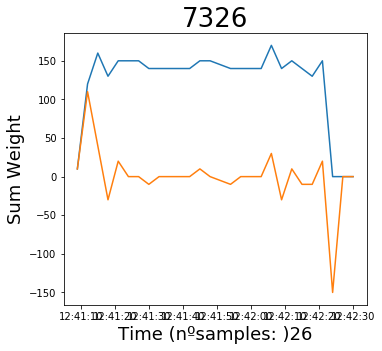

In [63]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

lol=dados.loc[7326]
plt.subplot(1, 4, 1)
plt.plot(lol.timestamp, lol[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(lol.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('7326', fontsize=26)


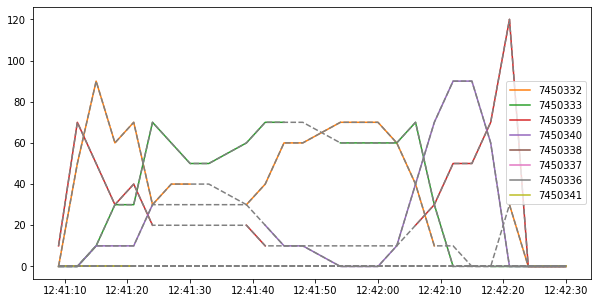

In [92]:
import matplotlib.pyplot as plt

lol=DATA.set_index('measurement').loc[7326]
lol2=DATA_interpolado.set_index('measurement').loc[7326]
plt.figure(figsize=(10,5))
ax = plt.gca()
color = next(ax._get_lines.prop_cycler)['color']
plt.plot(lol.timestamp, lol[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])#,color = color)#, 'g')
plt.plot(lol2.timestamp, lol2[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']],'--',color='gray')
#plt.plot(lol.timestamp, lol[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])#,color = color)#, 'g')
plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])
#plt.plot(lol.timestamp, lol[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])#, 'g')


In [68]:
DATA.set_index('measurement').loc[7326]

,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341,0,timestamp,period
measurement,,,,,,,,,,,
7326,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0,2020-02-13 12:41:09,02:48:20
7326,50.0,0.0,70.0,0.0,0.0,0.0,0.0,0.0,0,2020-02-13 12:41:12,00:00:03
7326,90.0,10.0,50.0,10.0,0.0,0.0,0.0,0.0,0,2020-02-13 12:41:15,00:00:03
7326,60.0,30.0,30.0,10.0,0.0,0.0,0.0,0.0,0,2020-02-13 12:41:18,00:00:03
7326,70.0,30.0,40.0,10.0,0.0,0.0,0.0,0.0,0,2020-02-13 12:41:21,00:00:03
7326,30.0,70.0,20.0,30.0,NaN,NaN,NaN,NaN,4,2020-02-13 12:41:24,00:00:03
7326,40.0,60.0,NaN,NaN,NaN,NaN,NaN,NaN,6,2020-02-13 12:41:27,00:00:03
7326,40.0,50.0,20.0,NaN,NaN,NaN,NaN,NaN,5,2020-02-13 12:41:30,00:00:03
7326,NaN,50.0,NaN,NaN,NaN,NaN,NaN,NaN,7,2020-02-13 12:41:33,00:00:03


In [57]:
filtrado2

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
5,5,0.0,0,2019-05-09 15:15:43,00:26:18,0.0
5,5,520.0,0,2019-05-09 15:15:46,00:00:03,520.0
5,5,3130.0,0,2019-05-09 15:15:49,00:00:03,2610.0
5,5,0.0,0,2019-05-09 15:15:52,00:00:03,-3130.0
5,5,0.0,0,2019-05-09 15:15:55,00:00:03,0.0
...,...,...,...,...,...,...
13110,13110,450.0,0,2020-07-24 13:24:43,00:00:02,450.0
13110,13110,3950.0,2,2020-07-24 13:24:45,00:00:02,3500.0
13110,13110,0.0,0,2020-07-24 13:24:47,00:00:02,-3950.0


In [24]:
dados.head()

,peso,0,timestamp,period,diff,new_measurement
measurement,,,,,,
1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN,1
1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0,1
1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0,1
1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0,1
2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,2


In [61]:
filtrado.reset_index().groupby('measurement').peso.nunique().min()

9

In [13]:
filtrado

,measurement,peso,0,timestamp,period,diff,new_measurement
52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,8
53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,8
54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,8
55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,8
56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,8
...,...,...,...,...,...,...,...
422902,13085,4420.0,2,2020-07-24 07:59:42,00:00:02,-820.0,13085
422903,13085,3480.0,2,2020-07-24 07:59:44,00:00:02,-940.0,13085
422904,13085,0.0,0,2020-07-24 07:59:46,00:00:02,-3480.0,13085
422905,13085,0.0,0,2020-07-24 07:59:48,00:00:02,0.0,13085


In [23]:
dados['new_measurement'].nunique()

11519

In [22]:
filtrado['new_measurement'].nunique()

1937

In [27]:
filtrado2['new_measurement'].nunique()

4256

In [66]:
dados.set_index('new_measurement')#.loc[11477]

,peso,0,timestamp,period,diff
new_measurement,,,,,
1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN
1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0
1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0
1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0
2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0
...,...,...,...,...,...
13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0
13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0
13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0


### Filtrar dentro de pasagens ruido

In [38]:
dados.loc[2]

,peso,0,timestamp,period,diff,new_measurement
measurement,,,,,,
2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,2
2,-860.0,7,2019-05-09 14:30:43,00:00:03,-860.0,2
2,0.0,0,2019-05-09 14:30:46,00:00:03,860.0,2
2,10.0,0,2019-05-09 14:30:49,00:00:03,10.0,2
2,80.0,0,2019-05-09 14:30:52,00:00:03,70.0,2
2,70.0,0,2019-05-09 14:30:55,00:00:03,-10.0,2
2,80.0,0,2019-05-09 14:30:58,00:00:03,10.0,2
2,70.0,4,2019-05-09 14:31:01,00:00:03,-10.0,2
2,80.0,0,2019-05-09 14:31:04,00:00:03,10.0,2


In [15]:
dados.new_measurement.nunique()

8632

In [ ]:
dados.new_measurement.nunique()

In [ ]:
dados.loc[[12965]]

In [37]:
dados

,peso,0,timestamp,period,diff,new_measurement
measurement,,,,,,
1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN,1
1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0,1
1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0,1
1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0,1
2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,2
...,...,...,...,...,...,...
13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0,13111
13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0,13111
13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0,13111


In [ ]:
dados.new_measurement.nunique()#.loc[[10318,10319]]

In [ ]:
lol=dados.reset_index().set_index('new_measurement').loc[[9505]]#38,39,40]]

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(lol.timestamp, lol[['peso','diff']])
plt.legend(['peso','diff'])

In [ ]:
lol

In [16]:
intermedio=dados.reset_index().groupby('new_measurement').nunique()#[['measurement']]
intermedio.measurement.max()#[intermedio.measurement == 2]

190

In [ ]:
intermedio=dados.reset_index().groupby('new_measurement').nunique()[['measurement']]
intermedio[intermedio.measurement == 56]

In [ ]:
intermedio=dados.reset_index().groupby('new_measurement').nunique()[['measurement']]
intermedio[intermedio.measurement == 2]

In [ ]:
dados

In [ ]:
amostra['diff'].unique()

In [ ]:
amostra=dados.loc[[40,41,42,43,44,45,46]]#12965,12966,12967,12968]]#[0:10]

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(amostra.timestamp, amostra[['peso','diff']])
plt.legend(['peso','diff'])

In [ ]:
amostra

In [ ]:
amostra=dados.loc[[12965,12966,12967,12968]]
amostra

In [ ]:
dados.loc[[12966]]


In [ ]:
dados.loc[[12964]]

In [ ]:
dados.loc[[9760,9761]]

In [ ]:

amostra=dados.loc[[12965,12966,12967,12968]]
amostra

import matplotlib.pyplot as plt

plt.figure(figsize=(20,5))
plt.plot(amostra.timestamp, amostra[['peso','diff']])
plt.legend(['peso','diff'])
plt.xlabel('Time', fontsize=18)
plt.ylabel('Weight', fontsize=18)
plt.title('Largest weighing 3023', fontsize=22)


fig = plt.figure(figsize=(20,5))


plt.subplot(1, 2, 1)
plt.plot(dados.loc[[12965,12966]].timestamp, dados.loc[[12965,12966]][['peso','diff']])
plt.legend(['peso','diff'])
plt.xlabel('Time', fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)



plt.subplot(1, 2, 2)
plt.plot(dados.loc[[12967,12968]].timestamp, dados.loc[[12967,12968]][['peso','diff']])
plt.legend(['peso','diff'])
plt.xlabel('Time', fontsize=18)
plt.ylabel('Weight', fontsize=18)





In [ ]:
plt.figure(figsize=(20,10))
plt.plot(amostra.timestamp, amostra[['peso','diff']])
plt.legend(['peso','diff'])

In [ ]:
dados.loc[[12965]]

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(dados.loc[[12966]].timestamp, dados.loc[[12966]][['peso','diff']])
plt.legend(['peso','diff'])

### TOP

##### proximos passos
- aceitar nao so igual mas com tolerancia +- 10%
- filtrar new_measuremtns como se fazia antes: poucas pessagens,, ruido...
- juntar pesagens duplas de camioes se as pesagens tiverem intervalos<x

##### NOW -clusters

In [10]:
dados.new_measurement.nunique()

11519

In [22]:
filtrado3.new_measurement.nunique()

2892

In [91]:
dados=dados2

In [104]:
dados.reset_index(inplace=True)#.set_index('new_measurement')

ValueError: cannot insert new_measurement, already exists

In [67]:
dados_backup=dados
dados=filtrado

In [68]:
dados

,measurement,peso,0,timestamp,period,diff,new_measurement
52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,8
53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,8
54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,8
55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,8
56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,8
...,...,...,...,...,...,...,...
422902,13085,4420.0,2,2020-07-24 07:59:42,00:00:02,-820.0,13085
422903,13085,3480.0,2,2020-07-24 07:59:44,00:00:02,-940.0,13085
422904,13085,0.0,0,2020-07-24 07:59:46,00:00:02,-3480.0,13085
422905,13085,0.0,0,2020-07-24 07:59:48,00:00:02,0.0,13085


In [12]:
dados=filtrado3

In [13]:
forcluster=dados.reset_index().groupby('new_measurement')['diff'].mean().to_frame().rename(columns={"diff": "mean"})

forcluster['std']=dados.reset_index().groupby('new_measurement')['diff'].std()
forcluster['meanpeso']=dados.reset_index().groupby('new_measurement')['peso'].mean()
forcluster['stdpeso']=dados.reset_index().groupby('new_measurement')['peso'].std()

forcluster['max']=dados.reset_index().groupby('new_measurement')['peso'].max()
forcluster['min']=dados.reset_index().groupby('new_measurement')['peso'].min()

forcluster['mediandiff']=dados.reset_index().groupby('new_measurement')['diff'].median()
forcluster['medianpeso']=dados.reset_index().groupby('new_measurement')['peso'].median()

forcluster['counts']=dados.reset_index().groupby('new_measurement')['peso'].count()#['peso'].min()

forcluster

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts
new_measurement,,,,,,,,,
8,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24
16,0.000000,824.918729,762.500000,1035.463225,2180.0,0.0,0.0,30.0,12
22,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72
23,0.000000,3728.744737,20529.264706,6865.129781,23080.0,0.0,0.0,22810.0,68
24,1896.818182,5799.831185,23229.090909,15732.983524,41800.0,40.0,180.0,18620.0,22
...,...,...,...,...,...,...,...,...,...
13097,0.000000,1281.249390,790.000000,1323.572606,3180.0,-10.0,0.0,10.0,10
13099,0.000000,4830.545666,3167.500000,4712.296225,10700.0,0.0,0.0,195.0,8
13101,0.000000,3180.431487,514.210526,2205.468748,9620.0,-20.0,0.0,0.0,19


In [ ]:
forcluster[forcluster.meanpeso < 10]

In [ ]:
forcluster=forcluster[forcluster.meanpeso>10]

In [ ]:
forcluster2

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(dados.loc[[13100,13102]].timestamp, dados.loc[[13100,13102]][['peso','diff']])
plt.legend(['peso','diff'])

In [ ]:
nan_rows = forcluster[forcluster['std'].isnull()]
nan_rows

In [ ]:
dados.loc[[46]]

In [ ]:
dados.loc[[47]]

In [20]:
forcluster=forcluster.fillna(0)

In [22]:
forcluster.isnull().sum()

mean             0
std           1098
meanpeso         0
stdpeso       1098
max              0
min              0
mediandiff       0
medianpeso       0
counts           0
dtype: int64

#### MA politica: entratanto deitar fora, no futuro, dar margem

In [13]:
forcluster=forcluster.dropna()

In [25]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
from sklearn import datasets

#X = Y #dataFinal
#KMeans
km = KMeans(n_clusters=2)
km.fit(forcluster) #forcluster
km.predict(forcluster) #forcluster
labels = km.labels_

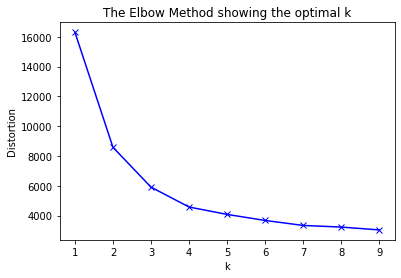

In [26]:
from scipy.spatial.distance import cdist
distortions = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k).fit(forcluster)
    km.fit(forcluster)
    distortions.append(sum(np.min(cdist(forcluster, km.cluster_centers_, 'euclidean'), axis=1)) / forcluster.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [99]:
forcluster.columns

Index(['mean', 'std', 'meanpeso', 'stdpeso', 'max', 'min', 'mediandiff',
       'medianpeso', 'counts'],
      dtype='object')

In [182]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

X=forcluster #forcluster

trace = go.Scatter3d(
    x= X.values[:, 8],  
    y= X.values[:, 7],
    z= X.values[:, 0],  
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': labels,
    }
)


In [183]:
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [184]:
verdadeiros=dados.reset_index().set_index('new_measurement')

In [138]:
filtrado.reset_index().new_measurement.nunique()#.loc[5616]

1937

In [27]:
forcluster['Kmeans_label']=labels#.value_counts()
forcluster['Kmeans_label'].value_counts()

0    1947
1     945
Name: Kmeans_label, dtype: int64

In [28]:
forcluster.to_csv('new_measur_filtradofora.csv')

In [186]:
class1=forcluster[forcluster['Kmeans_label']==1]
class1.sort_values(by=['counts'],ascending=False).head(30)#.counts.max()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,
12947,0.00000,1251.849721,12032.902285,13135.044072,44640.0,-10.0,0.0,13320.0,2057,1
13029,0.00000,1208.896261,38080.252193,12896.327514,45270.0,-40.0,0.0,45030.0,1824,1
10738,0.00000,769.094716,35755.134680,5107.895020,36900.0,-50.0,0.0,36780.0,1782,1
5075,0.00000,1079.992832,13604.105081,9992.224149,45070.0,0.0,0.0,16570.0,1732,1
3216,0.00000,852.038439,16812.106861,4102.161582,28410.0,-10.0,0.0,15750.0,1647,1
10878,-0.00721,1553.072062,43074.931507,7325.340561,45150.0,-40.0,0.0,44510.0,1387,1
3376,0.00000,586.185120,16718.447761,1874.025228,17100.0,0.0,0.0,16990.0,1340,1
1986,0.00000,866.780837,26191.442006,1936.585057,26510.0,-10.0,0.0,26350.0,1276,1
8614,0.00000,529.449449,16504.728132,1079.161606,16610.0,-10.0,0.0,16580.0,1269,1


Text(0.5, 1.0, '2851')

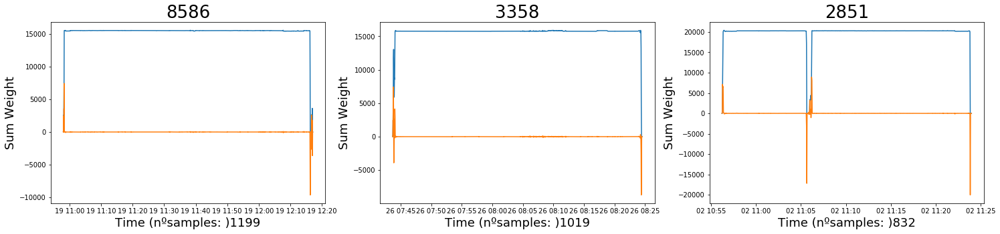

In [191]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))


teste=verdadeiros.loc[8586]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('8586', fontsize=26)

teste=verdadeiros.loc[3358]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('3358', fontsize=26)

teste=verdadeiros.loc[2851]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2851', fontsize=26)


In [188]:
class0=forcluster[forcluster['Kmeans_label']==0]
class0.sort_values(by=['counts'],ascending=False).head(30)

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,
1301,0.000000,524.082945,359.829184,2274.405556,41840.0,-10.0,0.0,30.0,20607,0
11360,0.000000,6.188630,40.842956,14.653566,220.0,-40.0,0.0,40.0,20179,0
2960,0.001932,269.002588,915.408643,3859.336875,19560.0,0.0,0.0,30.0,15527,0
1723,0.000000,547.979917,1685.360825,5667.486821,25340.0,-30.0,0.0,40.0,10961,0
10831,0.001531,71.935504,15.463176,62.740958,4730.0,0.0,0.0,10.0,6531,0
5571,0.000000,20.129850,60.179910,36.267845,1080.0,0.0,0.0,50.0,5336,0
5616,0.000000,6.546061,111.734583,89.562280,370.0,0.0,0.0,80.0,4589,0
3023,0.000000,707.690577,2007.769977,6097.349433,25660.0,0.0,0.0,30.0,2991,0
10394,0.004531,390.284377,318.164930,1706.836564,12080.0,-10.0,0.0,10.0,2207,0


Text(0.5, 1.0, '5571')

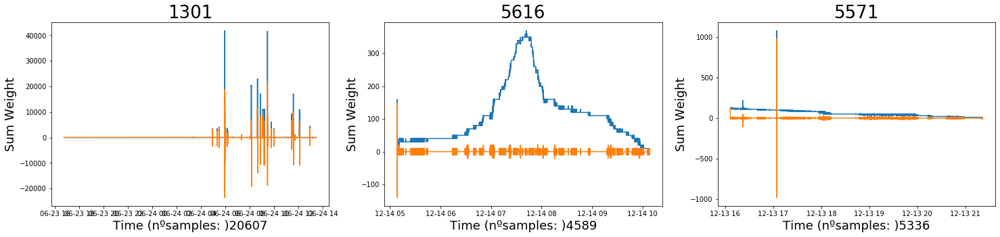

In [192]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))


teste=verdadeiros.loc[1301]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('1301', fontsize=26)

teste=verdadeiros.loc[5616]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('5616', fontsize=26)

teste=verdadeiros.loc[5571]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('5571', fontsize=26)

In [194]:
verdadeiros.loc[10318]#.peso.nunique()

,level_0,index,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,,,
10318,235023,310034,10318,0.0,0,2020-05-18 08:00:48,00:00:38,0.0
10318,235024,310035,10318,30.0,4,2020-05-18 08:00:50,00:00:02,30.0
10318,235025,310036,10318,2010.0,0,2020-05-18 08:00:52,00:00:02,1980.0
10318,235026,310037,10318,2010.0,0,2020-05-18 08:00:54,00:00:02,0.0
10318,235027,310038,10318,2010.0,6,2020-05-18 08:00:56,00:00:02,0.0
...,...,...,...,...,...,...,...,...
10318,235352,310363,10319,5940.0,0,2020-05-18 08:12:58,00:00:02,1940.0
10318,235353,310364,10319,1700.0,1,2020-05-18 08:13:00,00:00:02,-4240.0
10318,235354,310365,10319,0.0,0,2020-05-18 08:13:02,00:00:02,-1700.0


In [120]:
verdadeiros.loc[5571].peso.nunique()

5

In [116]:
DATA.set_index('measurement').loc[5638]

,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341,0,timestamp,period
measurement,,,,,,,,,,,
5638,10.0,30.0,-30.0,70.0,30.0,60.0,30.0,20.0,0,2019-12-14 07:19:21,00:01:18
5638,10.0,30.0,-30.0,70.0,30.0,60.0,30.0,20.0,0,2019-12-14 07:19:23,00:00:02
5638,10.0,30.0,-30.0,70.0,30.0,60.0,30.0,20.0,0,2019-12-14 07:19:25,00:00:02
5638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,2019-12-14 07:19:27,00:00:02
5638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,2019-12-14 07:19:29,00:00:02


In [196]:
DATA.set_index('measurement').loc[12947]

,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341,0,timestamp,period
measurement,,,,,,,,,,,
12947,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7,2020-07-21 07:07:44,00:01:04
12947,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7,2020-07-21 07:07:52,00:00:08
12947,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7,2020-07-21 07:08:00,00:00:08
12947,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7,2020-07-21 07:08:04,00:00:04
12947,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7,2020-07-21 07:08:06,00:00:02
...,...,...,...,...,...,...,...,...,...,...,...
12947,NaN,NaN,NaN,NaN,NaN,4060.0,NaN,NaN,7,2020-07-21 07:29:16,00:00:28
12947,NaN,NaN,NaN,5040.0,NaN,4050.0,NaN,NaN,6,2020-07-21 07:29:18,00:00:02
12947,NaN,NaN,4410.0,5040.0,NaN,NaN,NaN,NaN,6,2020-07-21 07:29:20,00:00:02


In [197]:
verdadeiros.loc[12947]

,level_0,index,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,,,
12947,326071,412267,12947,0.0,7,2020-07-21 07:07:44,00:01:04,0.0
12947,326072,412268,12947,0.0,7,2020-07-21 07:07:52,00:00:08,0.0
12947,326073,412269,12947,0.0,7,2020-07-21 07:08:00,00:00:08,0.0
12947,326074,412270,12947,0.0,7,2020-07-21 07:08:04,00:00:04,0.0
12947,326075,412271,12947,0.0,7,2020-07-21 07:08:06,00:00:02,0.0
...,...,...,...,...,...,...,...,...
12947,328123,414319,12955,0.0,7,2020-07-21 08:55:09,00:00:02,-10.0
12947,328124,414320,12955,10.0,7,2020-07-21 08:55:13,00:00:04,10.0
12947,328125,414321,12955,0.0,7,2020-07-21 08:55:15,00:00:02,-10.0


### LIMPAR RUIDO DENTRO PESAGEM

In [14]:
filtrado3

,index,measurement,peso,0,timestamp,period,diff,new_measurement
6,52,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,8
7,53,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,8
8,54,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,8
9,55,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,8
10,56,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,8
...,...,...,...,...,...,...,...,...
336144,423046,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0,13108
336145,423047,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0,13108
336146,423048,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0,13108
336147,423049,13108,0.0,0,2020-07-24 11:58:02,00:00:02,-10.0,13108


In [13]:
verdadeiros=filtrado3.set_index('new_measurement').drop(['index'],axis=1)

In [14]:
pesagemteste=verdadeiros.loc[3023]

In [15]:
pesagemteste

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...
3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0


Text(0.5, 1.0, '10318')

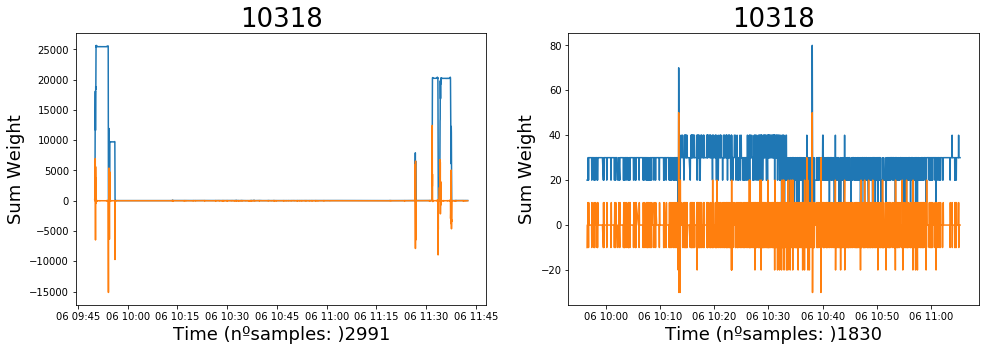

In [19]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))

teste=pesagemteste
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=pesagemteste[170:2000]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

In [39]:
pesagemteste.iloc[5].peso<200 

False

In [22]:
pesagemteste.iloc[99]

measurement                   3023
peso                            10
0                                0
timestamp      2019-09-06 09:54:11
period             0 days 00:00:02
diff                        -15150
Name: 3023, dtype: object

In [54]:
noise

,0,diff,measurement,period,peso,timestamp
0,0.0,-15150.0,3023.0,00:00:02,10.0,2019-09-06 09:54:11
1,0.0,10.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
2,0.0,-10.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
3,0.0,0.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
4,0.0,10.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
...,...,...,...,...,...,...
569,7.0,0.0,3023.0,00:00:02,30.0,2019-09-06 10:20:03
570,7.0,0.0,3023.0,00:00:04,30.0,2019-09-06 10:20:07
571,7.0,0.0,3023.0,00:00:02,30.0,2019-09-06 10:20:09
572,7.0,0.0,3023.0,00:00:02,30.0,2019-09-06 10:20:11


In [23]:
a=0
noise=pd.DataFrame()
while pesagemteste.iloc[a].peso <200:
    noise=noise.append(pesagemteste.iloc[a],ignore_index=True)
    a=a+1

In [24]:
noise

""


In [44]:
pesagemteste.iloc[3]

measurement                   3023
peso                          6670
0                                0
timestamp      2019-09-06 09:50:09
period             0 days 00:00:02
diff                          6290
Name: 3023, dtype: object

In [45]:
pesagemteste.reset_index().loc[3]

new_measurement                   3023
measurement                       3023
peso                              6670
0                                    0
timestamp          2019-09-06 09:50:09
period                 0 days 00:00:02
diff                              6290
Name: 3, dtype: object

In [25]:
#MELHOR
i=0
noise=pd.DataFrame()
while i< 200:
    if pesagemteste.iloc[i].peso <200:
        while pesagemteste.iloc[i].peso <200:
            print(i)
            noise=noise.append(pesagemteste.iloc[i],ignore_index=True)
            i=i+1
    i=i+1

99
100
101
102
108
109
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
4

2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208


KeyboardInterrupt: 

In [56]:
noise=[]

In [58]:
type(noise)

list

In [36]:
#GENERALIZAR

In [41]:
print(filtrado3.shape)
print(filtrado3.new_measurement.nunique())

(327519, 8)
2892


In [42]:
verdadeiros=filtrado3.set_index('new_measurement').drop(['index'],axis=1)
verdadeiros.head(3)

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
8,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0
8,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0
8,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0


In [33]:
filtrodentro=verdadeiros.groupby('new_measurement').apply(lambda x: x[x.peso>200])


In [ ]:
dados.groupby('measurement').apply(lambda x: x.reset_index().reset_index().set_index('measurement'))

In [34]:
verdadeiros

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
8,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0
8,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0
8,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0
8,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0
8,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0
...,...,...,...,...,...,...
13108,13108,310.0,0,2020-07-24 11:57:56,00:00:02,260.0
13108,13108,1090.0,1,2020-07-24 11:57:58,00:00:02,780.0
13108,13108,10.0,0,2020-07-24 11:58:00,00:00:02,-1080.0


In [37]:
len(filtrodentro.loc[3023])

322

In [38]:
len(verdadeiros.loc[3023])

2991

In [36]:
len(filtrodentro.loc[8])

23

In [51]:
len(verdadeiros.loc[8])

24

In [39]:
filtrodentro.loc[3023]

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...
3023,3023,7210.0,0,2019-09-06 11:37:31,00:00:02,1090.0
3023,3023,12270.0,1,2019-09-06 11:37:33,00:00:02,5060.0
3023,3023,11220.0,0,2019-09-06 11:37:35,00:00:02,-1050.0


Text(0.5, 1.0, '10318')

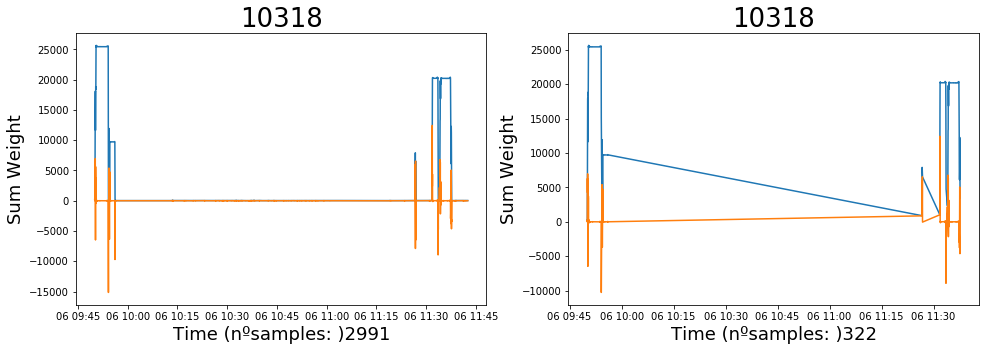

In [40]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))

teste=pesagemteste
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=filtrodentro.loc[3023]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

In [57]:
filtrodentro

measurement     peso  0           timestamp  \
new_measurement new_measurement                                                
8               8                          8    630.0  0 2019-05-09 15:46:29   
                8                          8  22040.0  0 2019-05-09 15:46:35   
                8                          8  17400.0  0 2019-05-09 15:46:35   
                8                          8  21830.0  0 2019-05-09 15:46:38   
                8                          8  21840.0  0 2019-05-09 15:46:41   
...                                      ...      ... ..                 ...   
13099           13099                  13099  10250.0  0 2020-07-24 09:26:31   
13101           13101                  13101   9620.0  0 2020-07-24 10:09:35   
13103           13103                  13103    970.0  0 2020-07-24 11:07:51   
13108           13108                  13108    310.0  0 2020-07-24 11:57:56   
                13108                  13108   1090.0  1 2020-07-24 11:57:58   

                                  period     diff  
new_measurement new_measurement                    
8               8               00:00:06    630.0  
                8               00:00:06  21410.0  
                8               00:00:00  -4640.0  
                8               00:00:03   4430.0  
                8               00:00:03     10.0  
...                                  ...      ...  
13099           13099           00:00:02   -450.0  
13101           13101           00:00:02   9440.0  
13103           13103           00:00:02    900.0  
13108           13108           00:00:02    260.0  
                13108           00:00:02    780.0  

[205782 rows x 6 columns]

In [63]:
verdadeiros.loc[5616].sort_values(by=['period'])


,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
5616,5652,190.0,5,2019-12-14 08:01:34,00:00:01,10.0
5616,5651,220.0,7,2019-12-14 07:56:42,00:00:01,0.0
5616,5651,210.0,8,2019-12-14 07:57:36,00:00:01,0.0
5616,5651,220.0,7,2019-12-14 07:56:24,00:00:01,0.0
5616,5651,220.0,7,2019-12-14 07:56:16,00:00:01,0.0
...,...,...,...,...,...,...
5616,5654,160.0,7,2019-12-14 08:13:54,00:05:16,0.0
5616,5626,50.0,7,2019-12-14 06:27:29,00:05:42,0.0
5616,5663,110.0,0,2019-12-14 09:09:50,00:05:58,0.0


In [32]:
# LINDO!!
lixo=novo
for i in range(novo.shape[0]-10):
    if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10:
           lixo=lixo.drop([i])

In [31]:
novo

,0,diff,index,measurement,new_measurement,period,peso,timestamp
0,0.0,10.0,100.0,3023.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
1,0.0,-10.0,101.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
2,0.0,0.0,102.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
3,0.0,130.0,109.0,3023.0,3023.0,00:00:02,150.0,2019-09-06 09:54:31
4,0.0,-10.0,159.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
...,...,...,...,...,...,...,...,...
2657,6.0,0.0,2986.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:23
2658,6.0,0.0,2987.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:25
2659,6.0,0.0,2988.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:27
2660,6.0,0.0,2989.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:29


In [17]:
pesagemteste.head(3)

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0


In [15]:
teste=pesagemteste.reset_index().reset_index()

In [26]:
novo=teste[teste.peso < 200].reset_index(drop=True)

In [30]:
novo=pd.DataFrame()
for i in range(1,teste.shape[0]):
    if teste.peso[i] < 200 and teste.peso[i-1] < 200:
        novo=novo.append(teste.loc[i])
novo=novo.reset_index(drop=True)

In [189]:
novo.head(10)

,0,diff,index,measurement,new_measurement,period,peso,timestamp
0,0.0,10.0,100,3023.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
1,0.0,-10.0,101,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
2,0.0,0.0,102,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
3,0.0,130.0,109,3023.0,3023.0,00:00:02,150.0,2019-09-06 09:54:31
4,0.0,-10.0,159,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
5,1.0,0.0,160,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:13
6,6.0,20.0,161,3023.0,3023.0,00:00:02,30.0,2019-09-06 09:56:15
7,6.0,-20.0,162,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:17
8,6.0,0.0,163,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:19
9,6.0,0.0,164,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:21


In [35]:
novo.head(10)

,0,diff,index,measurement,new_measurement,period,peso,timestamp
0,0.0,10.0,100.0,3023.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
1,0.0,-10.0,101.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
2,0.0,0.0,102.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
3,0.0,130.0,109.0,3023.0,3023.0,00:00:02,150.0,2019-09-06 09:54:31
4,0.0,-10.0,159.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
5,1.0,0.0,160.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:13
6,6.0,20.0,161.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 09:56:15
7,6.0,-20.0,162.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:17
8,6.0,0.0,163.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:19
9,6.0,0.0,164.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:21


In [185]:
teste.loc[150:200]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
150,150,3023,3023,9720.0,7,2019-09-06 09:55:53,00:00:02,0.0
151,151,3023,3023,9720.0,7,2019-09-06 09:55:55,00:00:02,0.0
152,152,3023,3023,9720.0,5,2019-09-06 09:55:57,00:00:02,0.0
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0
157,157,3023,3023,9730.0,0,2019-09-06 09:56:07,00:00:02,0.0
158,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
159,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0


In [144]:
teste

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
4,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
2986,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2987,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2988,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2989,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [190]:
novo[['index']]=novo[['index']].astype('int32')

In [191]:
novo

,0,diff,index,measurement,new_measurement,period,peso,timestamp
0,0.0,10.0,100,3023.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
1,0.0,-10.0,101,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
2,0.0,0.0,102,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
3,0.0,130.0,109,3023.0,3023.0,00:00:02,150.0,2019-09-06 09:54:31
4,0.0,-10.0,159,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
...,...,...,...,...,...,...,...,...
2657,6.0,0.0,2986,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:23
2658,6.0,0.0,2987,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:25
2659,6.0,0.0,2988,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:27
2660,6.0,0.0,2989,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:29


In [147]:
novo.dtypes

index                        int64
new_measurement              int64
measurement                  int64
peso                       float64
0                            int64
timestamp           datetime64[ns]
period             timedelta64[ns]
diff                       float64
dtype: object

In [138]:
novo

,0,diff,index,measurement,new_measurement,period,peso,timestamp
100,0.0,10.0,100.0,3023.0,3023.0,00:00:02,20.0,2019-09-06 09:54:13
101,0.0,-10.0,101.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:15
102,0.0,0.0,102.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:54:17
109,0.0,130.0,109.0,3023.0,3023.0,00:00:02,150.0,2019-09-06 09:54:31
159,0.0,-10.0,159.0,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
...,...,...,...,...,...,...,...,...
2986,6.0,0.0,2986.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:23
2987,6.0,0.0,2987.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:25
2988,6.0,0.0,2988.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:27
2989,6.0,0.0,2989.0,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:29


In [126]:
teste.peso[0] 

210.0

In [125]:
teste.peso < 200 

0       False
1       False
2       False
3       False
4       False
        ...  
2986     True
2987     True
2988     True
2989     True
2990     True
Name: peso, Length: 2991, dtype: bool

In [124]:
teste.loc[150:170]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
150,150,3023,3023,9720.0,7,2019-09-06 09:55:53,00:00:02,0.0
151,151,3023,3023,9720.0,7,2019-09-06 09:55:55,00:00:02,0.0
152,152,3023,3023,9720.0,5,2019-09-06 09:55:57,00:00:02,0.0
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0
157,157,3023,3023,9730.0,0,2019-09-06 09:56:07,00:00:02,0.0
158,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
159,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0


In [40]:
lixo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
6,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
7,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0
8,160,3023,3023,10.0,1,2019-09-06 09:56:13,00:00:02,0.0
9,161,3023,3023,30.0,6,2019-09-06 09:56:15,00:00:02,20.0
10,162,3023,3023,10.0,6,2019-09-06 09:56:17,00:00:02,-20.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [16]:
novo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,99,3023,3023,10.0,0,2019-09-06 09:54:11,00:00:02,-15150.0
1,100,3023,3023,20.0,0,2019-09-06 09:54:13,00:00:02,10.0
2,101,3023,3023,10.0,0,2019-09-06 09:54:15,00:00:02,-10.0
3,102,3023,3023,10.0,0,2019-09-06 09:54:17,00:00:02,0.0
4,108,3023,3023,20.0,0,2019-09-06 09:54:29,00:00:02,-6360.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [147]:
if 
novo.drop([0])

,index,new_measurement,measurement,peso,0,timestamp,period,diff
1,100,3023,3023,20.0,0,2019-09-06 09:54:13,00:00:02,10.0
2,101,3023,3023,10.0,0,2019-09-06 09:54:15,00:00:02,-10.0
3,102,3023,3023,10.0,0,2019-09-06 09:54:17,00:00:02,0.0
4,108,3023,3023,20.0,0,2019-09-06 09:54:29,00:00:02,-6360.0
5,109,3023,3023,150.0,0,2019-09-06 09:54:31,00:00:02,130.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [156]:
novo.iloc[0]['index']

99

In [162]:
i=0
novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10

True

In [41]:
teste

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
4,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
2841,2841,3023,3023,7210.0,0,2019-09-06 11:37:31,00:00:02,1090.0
2842,2842,3023,3023,12270.0,1,2019-09-06 11:37:33,00:00:02,5060.0
2843,2843,3023,3023,11220.0,0,2019-09-06 11:37:35,00:00:02,-1050.0
2844,2844,3023,3023,6580.0,0,2019-09-06 11:37:37,00:00:02,-4640.0


In [16]:
novo.shape[0]

NameError: name 'novo' is not defined

In [141]:
novo.shape[0]

2662

In [17]:
# LINDO!!
lixo=novo
for i in range(novo.shape[0]-10):
    if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10:
           lixo=lixo.drop([i])


In [18]:
lixo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
6,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
7,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0
8,160,3023,3023,10.0,1,2019-09-06 09:56:13,00:00:02,0.0
9,161,3023,3023,30.0,6,2019-09-06 09:56:15,00:00:02,20.0
10,162,3023,3023,10.0,6,2019-09-06 09:56:17,00:00:02,-20.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [193]:
lixo

,0,diff,index,measurement,new_measurement,period,peso,timestamp
4,0.0,-10.0,159,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:11
5,1.0,0.0,160,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:13
6,6.0,20.0,161,3023.0,3023.0,00:00:02,30.0,2019-09-06 09:56:15
7,6.0,-20.0,162,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:17
8,6.0,0.0,163,3023.0,3023.0,00:00:02,10.0,2019-09-06 09:56:19
...,...,...,...,...,...,...,...,...
2657,6.0,0.0,2986,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:23
2658,6.0,0.0,2987,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:25
2659,6.0,0.0,2988,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:27
2660,6.0,0.0,2989,3023.0,3023.0,00:00:02,30.0,2019-09-06 11:42:29


In [ ]:
lixo=novo
for i in range(novo.shape[0]-10):
    if novo.iloc[i+10]['index'] != novo.iloc[i]['index']+10 and :
           lixo=lixo.drop([i])

In [29]:
sobras=novo.loc[~novo.set_index(list(novo.columns)).index.isin(lixo.set_index(list(lixo.columns)).index)]

In [31]:
novo.iloc[2360:2380]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
2360,2512,3023,3023,20.0,7,2019-09-06 11:26:01,00:00:02,0.0
2361,2513,3023,3023,30.0,7,2019-09-06 11:26:03,00:00:02,10.0
2362,2514,3023,3023,30.0,7,2019-09-06 11:26:05,00:00:02,0.0
2363,2515,3023,3023,30.0,7,2019-09-06 11:26:07,00:00:02,0.0
2364,2516,3023,3023,20.0,7,2019-09-06 11:26:09,00:00:02,-10.0
2365,2517,3023,3023,30.0,7,2019-09-06 11:26:11,00:00:02,10.0
2366,2518,3023,3023,30.0,7,2019-09-06 11:26:13,00:00:02,0.0
2367,2519,3023,3023,20.0,7,2019-09-06 11:26:15,00:00:02,-10.0
2368,2520,3023,3023,30.0,7,2019-09-06 11:26:17,00:00:02,10.0
2369,2521,3023,3023,30.0,7,2019-09-06 11:26:19,00:00:02,0.0


In [30]:
sobras

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,99,3023,3023,10.0,0,2019-09-06 09:54:11,00:00:02,-15150.0
1,100,3023,3023,20.0,0,2019-09-06 09:54:13,00:00:02,10.0
2,101,3023,3023,10.0,0,2019-09-06 09:54:15,00:00:02,-10.0
3,102,3023,3023,10.0,0,2019-09-06 09:54:17,00:00:02,0.0
4,108,3023,3023,20.0,0,2019-09-06 09:54:29,00:00:02,-6360.0
5,109,3023,3023,150.0,0,2019-09-06 09:54:31,00:00:02,130.0
2366,2518,3023,3023,30.0,7,2019-09-06 11:26:13,00:00:02,0.0
2367,2519,3023,3023,20.0,7,2019-09-06 11:26:15,00:00:02,-10.0
2368,2520,3023,3023,30.0,7,2019-09-06 11:26:17,00:00:02,10.0
2369,2521,3023,3023,30.0,7,2019-09-06 11:26:19,00:00:02,0.0


In [34]:
teste.head(3)

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0


In [164]:
teste

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
4,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
2986,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2987,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2988,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2989,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [19]:
boas=teste.loc[~teste.set_index(list(teste.columns)).index.isin(lixo.set_index(list(lixo.columns)).index)]#.reset_index(drop=True)

In [172]:
lixo.set_index(list(lixo.columns)).index

MultiIndex([(0.0, -10.0,  159, 3023.0, 3023.0, '00:00:02', 10.0, ...),
            (1.0,   0.0,  160, 3023.0, 3023.0, '00:00:02', 10.0, ...),
            (6.0,  20.0,  161, 3023.0, 3023.0, '00:00:02', 30.0, ...),
            (6.0, -20.0,  162, 3023.0, 3023.0, '00:00:02', 10.0, ...),
            (6.0,   0.0,  163, 3023.0, 3023.0, '00:00:02', 10.0, ...),
            (6.0,   0.0,  164, 3023.0, 3023.0, '00:00:02', 10.0, ...),
            (6.0,  20.0,  165, 3023.0, 3023.0, '00:00:02', 30.0, ...),
            (6.0, -10.0,  166, 3023.0, 3023.0, '00:00:02', 20.0, ...),
            (7.0,  10.0,  167, 3023.0, 3023.0, '00:00:02', 30.0, ...),
            (6.0, -10.0,  168, 3023.0, 3023.0, '00:00:02', 20.0, ...),
            ...
            (7.0,   0.0, 2981, 3023.0, 3023.0, '00:00:02', 30.0, ...),
            (6.0,   0.0, 2982, 3023.0, 3023.0, '00:00:02', 30.0, ...),
            (7.0,   0.0, 2983, 3023.0, 3023.0, '00:00:04', 30.0, ...),
            (6.0,  10.0, 2984, 3023.0, 3023.0, '00:00:02', 40

In [175]:
teste.columns

Index(['index', 'new_measurement', 'measurement', 'peso', '0', 'timestamp',
       'period', 'diff'],
      dtype='object')

In [194]:
lixo= lixo[['index', 'new_measurement', 'measurement', 'peso', '0', 'timestamp',
       'period', 'diff'] ]
lixo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
4,159,3023.0,3023.0,10.0,0.0,2019-09-06 09:56:11,00:00:02,-10.0
5,160,3023.0,3023.0,10.0,1.0,2019-09-06 09:56:13,00:00:02,0.0
6,161,3023.0,3023.0,30.0,6.0,2019-09-06 09:56:15,00:00:02,20.0
7,162,3023.0,3023.0,10.0,6.0,2019-09-06 09:56:17,00:00:02,-20.0
8,163,3023.0,3023.0,10.0,6.0,2019-09-06 09:56:19,00:00:02,0.0
...,...,...,...,...,...,...,...,...
2657,2986,3023.0,3023.0,30.0,6.0,2019-09-06 11:42:23,00:00:02,0.0
2658,2987,3023.0,3023.0,30.0,6.0,2019-09-06 11:42:25,00:00:02,0.0
2659,2988,3023.0,3023.0,30.0,6.0,2019-09-06 11:42:27,00:00:02,0.0
2660,2989,3023.0,3023.0,30.0,6.0,2019-09-06 11:42:29,00:00:02,0.0


In [45]:
lixo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
6,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
7,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0
8,160,3023,3023,10.0,1,2019-09-06 09:56:13,00:00:02,0.0
9,161,3023,3023,30.0,6,2019-09-06 09:56:15,00:00:02,20.0
10,162,3023,3023,10.0,6,2019-09-06 09:56:17,00:00:02,-20.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [20]:
boas.iloc[150:170]

,index,new_measurement,measurement,peso,0,timestamp,period,diff
150,150,3023,3023,9720.0,7,2019-09-06 09:55:53,00:00:02,0.0
151,151,3023,3023,9720.0,7,2019-09-06 09:55:55,00:00:02,0.0
152,152,3023,3023,9720.0,5,2019-09-06 09:55:57,00:00:02,0.0
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0
157,157,3023,3023,9730.0,0,2019-09-06 09:56:07,00:00:02,0.0
2518,2518,3023,3023,30.0,7,2019-09-06 11:26:13,00:00:02,0.0
2519,2519,3023,3023,20.0,7,2019-09-06 11:26:15,00:00:02,-10.0


In [22]:
boas.iloc[150:170]

,index,new_measurement,measurement,peso,0,timestamp,period,diff,slice_measurement
150,150,3023,3023,9720.0,7,2019-09-06 09:55:53,00:00:02,0.0,0
151,151,3023,3023,9720.0,7,2019-09-06 09:55:55,00:00:02,0.0,0
152,152,3023,3023,9720.0,5,2019-09-06 09:55:57,00:00:02,0.0,0
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0,0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0,0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0,0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0,0
157,157,3023,3023,9730.0,0,2019-09-06 09:56:07,00:00:02,0.0,0
2518,2518,3023,3023,30.0,7,2019-09-06 11:26:13,00:00:02,0.0,1
2519,2519,3023,3023,20.0,7,2019-09-06 11:26:15,00:00:02,-10.0,1


In [207]:
boas.iloc[150:170]#.head(15)

,index,new_measurement,measurement,peso,0,timestamp,period,diff,slice_measurement
150,150,3023,3023,9720.0,7,2019-09-06 09:55:53,00:00:02,0.0,0
151,151,3023,3023,9720.0,7,2019-09-06 09:55:55,00:00:02,0.0,0
152,152,3023,3023,9720.0,5,2019-09-06 09:55:57,00:00:02,0.0,0
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0,0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0,0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0,0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0,0
157,157,3023,3023,9730.0,0,2019-09-06 09:56:07,00:00:02,0.0,0
158,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0,0
2518,2518,3023,3023,30.0,7,2019-09-06 11:26:13,00:00:02,0.0,1


In [57]:
i=157
boas.iloc[i+1]['index']!= boas.iloc[i]['index']+1

True

In [21]:
a=0
boas['slice_measurement']=1
for i in range(boas.shape[0]-1):
    if boas.iloc[i+1]['index']!= boas.iloc[i]['index']+1:
        a=a+1
        boas['slice_measurement'][i+1]=a
    else:
        boas['slice_measurement'][i+1]=a
#boas.iloc[-1]['slice_measurement']=a
boas['slice_measurement'][boas.shape[0]-1]=2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:3326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, sel

In [87]:
boas.iloc[-1]['slice_measurement']=a


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [108]:
boas['slice_measurement'][boas.shape[0]-1]=a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [201]:
boas.slice_measurement.unique()

array([0, 1, 2])

In [23]:
boas2=boas.set_index('slice_measurement')
boas2

,index,new_measurement,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,
1,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
0,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
0,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
0,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
0,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
1,2841,3023,3023,7210.0,0,2019-09-06 11:37:31,00:00:02,1090.0
1,2842,3023,3023,12270.0,1,2019-09-06 11:37:33,00:00:02,5060.0
1,2843,3023,3023,11220.0,0,2019-09-06 11:37:35,00:00:02,-1050.0


In [208]:
boas2=boas.set_index('slice_measurement')
boas2

,index,new_measurement,measurement,peso,0,timestamp,period,diff
slice_measurement,,,,,,,,
1,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
0,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
0,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
0,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
0,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...,...,...
1,2842,3023,3023,12270.0,1,2019-09-06 11:37:33,00:00:02,5060.0
1,2843,3023,3023,11220.0,0,2019-09-06 11:37:35,00:00:02,-1050.0
1,2844,3023,3023,6580.0,0,2019-09-06 11:37:37,00:00:02,-4640.0


In [204]:
boas[boas.slice_measurement==0]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,index,new_measurement,measurement,peso,0,timestamp,period,diff,slice_measurement
0,0,3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0,0
1,1,3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0,0
2,2,3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0,0
3,3,3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0,0
4,4,3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0,0
...,...,...,...,...,...,...,...,...,...
153,153,3023,3023,9710.0,0,2019-09-06 09:55:59,00:00:02,-10.0,0
154,154,3023,3023,9760.0,0,2019-09-06 09:56:01,00:00:02,50.0,0
155,155,3023,3023,9770.0,0,2019-09-06 09:56:03,00:00:02,10.0,0
156,156,3023,3023,9730.0,0,2019-09-06 09:56:05,00:00:02,-40.0,0


In [107]:
a=3
a

3

Text(0.5, 1.0, '10318')

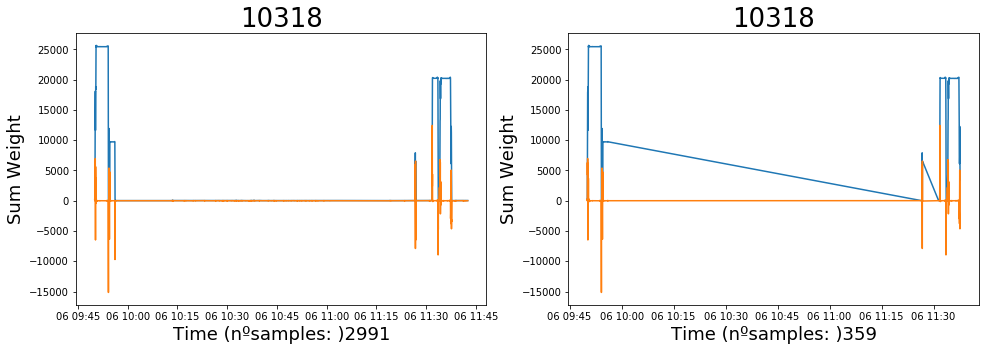

In [37]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=pesagemteste#[80:120]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=boas#[0:170]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

KeyError: 2

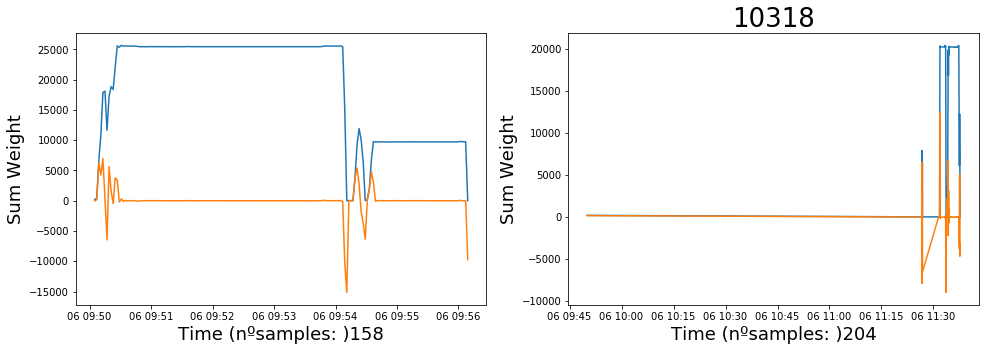

In [209]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=boas2.loc[0]#[80:120]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)

teste=boas2.loc[1]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)
teste=boas2.loc[2]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

In [23]:
novo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
0,99,3023,3023,10.0,0,2019-09-06 09:54:11,00:00:02,-15150.0
1,100,3023,3023,20.0,0,2019-09-06 09:54:13,00:00:02,10.0
2,101,3023,3023,10.0,0,2019-09-06 09:54:15,00:00:02,-10.0
3,102,3023,3023,10.0,0,2019-09-06 09:54:17,00:00:02,0.0
4,108,3023,3023,20.0,0,2019-09-06 09:54:29,00:00:02,-6360.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [28]:
lixo

,index,new_measurement,measurement,peso,0,timestamp,period,diff
6,158,3023,3023,20.0,0,2019-09-06 09:56:09,00:00:02,-9710.0
7,159,3023,3023,10.0,0,2019-09-06 09:56:11,00:00:02,-10.0
8,160,3023,3023,10.0,1,2019-09-06 09:56:13,00:00:02,0.0
9,161,3023,3023,30.0,6,2019-09-06 09:56:15,00:00:02,20.0
10,162,3023,3023,10.0,6,2019-09-06 09:56:17,00:00:02,-20.0
...,...,...,...,...,...,...,...,...
2664,2986,3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
2665,2987,3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
2666,2988,3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0
2667,2989,3023,3023,30.0,6,2019-09-06 11:42:29,00:00:02,0.0


In [ ]:
# lol
mas=pesagemteste.reset_index().reset_index().peso < 200
 pesagemteste.iloc[i].peso <200:
        while pesagemteste.iloc[i].peso <200:
            print(i)
            noise.append(i)
            i=i+1
    i=i+1

In [120]:
# MELHOR EM LISTA
i=0
noise=[]
while i< 200:
    if pesagemteste.iloc[i].peso <200:
        while pesagemteste.iloc[i].peso <200:
            print(i)
            noise.append(i)
            i=i+1
    i=i+1

99
100
101
102
108
109
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
4

2452
2453
2454
2455
2456
2457
2458
2459
2460
2461
2462
2463
2464
2465
2466
2467
2468
2469
2470
2471
2472
2473
2474
2475
2476
2477
2478
2479
2480
2481
2482
2483
2484
2485
2486
2487
2488
2489
2490
2491
2492
2493
2494
2495
2496
2497
2498
2499
2500
2501
2502
2503
2504
2505
2506
2507
2508
2509
2510
2511
2512
2513
2514
2515
2516
2517
2518
2519
2520
2521
2522
2523
2524
2525
2526
2527


In [ ]:
# MELHOR EM LISTA
i=0
noise=[]
while i< 200:
    if pesagemteste.iloc[i].peso <200:
        tr=0
        while pesagemteste.iloc[i].peso <200:
            tr=tr+1
            if tr>4:
                noise.append(i)
                i=i+1
    i=i+1

In [78]:
noise[-1]

2527

Text(0.5, 1.0, '10318')

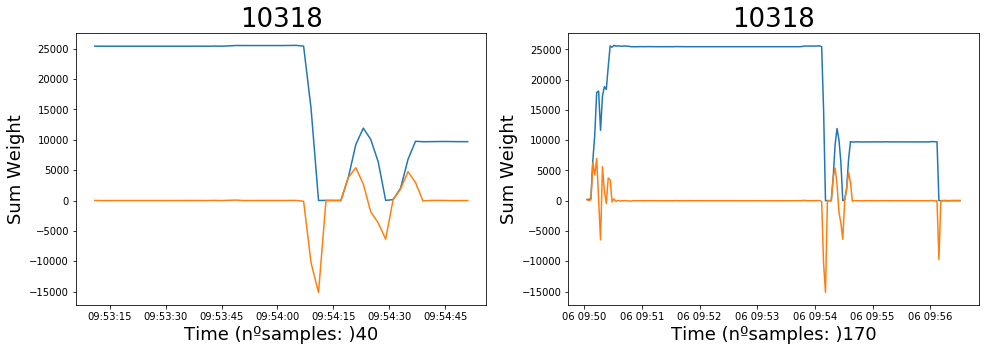

In [71]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=pesagemteste[80:120]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=pesagemteste[0:170]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)


In [121]:
noise2=noise

In [118]:
#for i in range(len(noise2)-10):
    #print(i)
i=0
while i<len(noise2)-10:
    if noise2[i+10] != noise2[i]+10:
        noise2.pop(i)
        #i=i+1
        print(i)
        print(noise2[i])
    i=i+1

1
101
3
109


In [122]:
noise2

[99,
 100,
 101,
 102,
 108,
 109,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 238,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,

In [117]:
noise2

[99,
 100,
 101,
 102,
 108,
 109,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 238,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,

In [101]:
for i in range(len(noise2)-10):
    #print(i)
    if noise2[i+10] != noise2[i]+10:
        noise2.pop(i)
        print(noise2[i])

100
102
109


IndexError: list index out of range

In [86]:
noise[6+10]

171

In [100]:
noise2#[6]#+10

[99,
 100,
 101,
 102,
 108,
 109,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 238,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,

In [97]:
noise

[102,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 238,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,
 319,
 320,
 321,
 322,
 323

In [79]:
len(noise)

2376

In [23]:
pesagemteste

,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,
3023,3023,210.0,5,2019-09-06 09:50:03,00:00:53,180.0
3023,3023,210.0,0,2019-09-06 09:50:05,00:00:02,0.0
3023,3023,380.0,0,2019-09-06 09:50:07,00:00:02,170.0
3023,3023,6670.0,0,2019-09-06 09:50:09,00:00:02,6290.0
3023,3023,10910.0,0,2019-09-06 09:50:11,00:00:02,4240.0
...,...,...,...,...,...,...
3023,3023,30.0,6,2019-09-06 11:42:23,00:00:02,0.0
3023,3023,30.0,6,2019-09-06 11:42:25,00:00:02,0.0
3023,3023,30.0,6,2019-09-06 11:42:27,00:00:02,0.0


In [24]:
noise.peso.max()

150.0

In [41]:
for i in range(pesagemteste.shape[0]-4):
    if pesagemteste.iloc[i].peso <200 and pesagemteste.iloc[i+1].peso<200 and pesagemteste.iloc[i+3].peso<200  and pesagemteste.iloc[i+4].peso<200:
        a=i
        while pesagemteste.iloc[a].peso <200:
            noise=pesagemteste.iloc[a]
        

KeyboardInterrupt: 

In [42]:
a

158

In [ ]:
for i in range(5,pesagemteste.shape[0]+5):
    if pesagemteste[i].peso <200 and pesagemteste[i-1].peso<200 and pesagemteste[i-2].peso<200 and pesagemteste[i-3].peso<200:
        

In [205]:
pesagemteste[170:200]

,level_0,index,measurement,peso,0,timestamp,period,diff
new_measurement,,,,,,,,
3023,102311,117958,3023,20.0,7,2019-09-06 09:56:33,00:00:02,-10.0
3023,102312,117959,3023,20.0,7,2019-09-06 09:56:35,00:00:02,0.0
3023,102313,117960,3023,20.0,7,2019-09-06 09:56:37,00:00:02,0.0
3023,102314,117961,3023,20.0,7,2019-09-06 09:56:39,00:00:02,0.0
3023,102315,117962,3023,20.0,7,2019-09-06 09:56:41,00:00:02,0.0
3023,102316,117963,3023,30.0,7,2019-09-06 09:56:43,00:00:02,10.0
3023,102317,117964,3023,30.0,7,2019-09-06 09:56:45,00:00:02,0.0
3023,102318,117965,3023,30.0,7,2019-09-06 09:56:47,00:00:02,0.0
3023,102319,117966,3023,20.0,7,2019-09-06 09:56:49,00:00:02,-10.0


Text(0.5, 1.0, '10318')

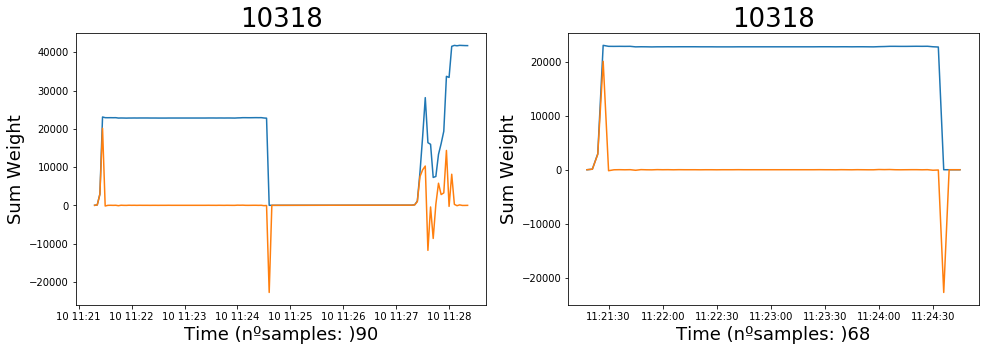

In [128]:

fig = plt.figure(figsize=(25,5))

teste=verdadeiros.loc[23]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=verdadeiros.reset_index().set_index('measurement').loc[23]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

In [129]:
verdadeiros.reset_index().set_index('measurement').loc[23]

,new_measurement,peso,0,timestamp,period,diff
measurement,,,,,,
23,23,0.0,0,2019-05-10 11:21:18,00:01:12,0.0
23,23,100.0,0,2019-05-10 11:21:21,00:00:03,100.0
23,23,2960.0,0,2019-05-10 11:21:24,00:00:03,2860.0
23,23,23080.0,0,2019-05-10 11:21:27,00:00:03,20120.0
23,23,22900.0,0,2019-05-10 11:21:30,00:00:03,-180.0
...,...,...,...,...,...,...
23,23,22770.0,0,2019-05-10 11:24:33,00:00:03,-50.0
23,23,0.0,0,2019-05-10 11:24:36,00:00:03,-22770.0
23,23,0.0,0,2019-05-10 11:24:39,00:00:03,0.0


In [33]:
verdadeiros=paranuno.reset_index().set_index('new_measurement')
verdadeiros

,measurement,peso,0,timestamp,period,diff,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341
new_measurement,,,,,,,,,,,,,,
1,1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13111,13111,10.0,0,2020-07-24 13:46:08,00:00:02,10.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13111,13111,10.0,0,2020-07-24 13:46:10,00:00:02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0
13111,13111,0.0,3,2020-07-24 13:46:12,00:00:02,-10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
class1

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,
8,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
22,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,1
23,463.666667,4367.578829,21189.222222,9759.428196,41800.0,0.0,0.0,22810.0,90,1
26,0.000000,2274.416455,9706.250000,5137.998048,12580.0,-20.0,0.0,12440.0,48,1
28,0.000000,3245.220075,21265.434783,8776.418330,25440.0,0.0,0.0,25320.0,46,1
...,...,...,...,...,...,...,...,...,...,...
13047,0.000000,2620.238811,28813.495935,10116.711976,35430.0,-10.0,0.0,35240.0,246,1
13049,0.000000,2024.949454,14675.000000,6181.419271,17950.0,-10.0,0.0,17390.0,70,1
13052,0.000000,2550.995485,12810.336134,9643.352583,21010.0,-30.0,0.0,20850.0,119,1


In [36]:
verdadeiros.head()

,measurement,peso,0,timestamp,period,diff,7450332,7450333,7450339,7450340,7450338,7450337,7450336,7450341
new_measurement,,,,,,,,,,,,,,
1,1,0.0,0,2019-05-09 14:22:55,00:00:00,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,-10.0,0,2019-05-09 14:22:58,00:00:03,-10.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0,2019-05-09 14:23:01,00:00:03,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0,2019-05-09 14:23:04,00:00:03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0,2019-05-09 14:30:40,00:07:36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [37]:
class1.head()

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,
8,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
22,0.000000,4135.709487,27892.638889,8326.248837,31520.0,0.0,0.0,30480.0,72,1
23,463.666667,4367.578829,21189.222222,9759.428196,41800.0,0.0,0.0,22810.0,90,1
26,0.000000,2274.416455,9706.250000,5137.998048,12580.0,-20.0,0.0,12440.0,48,1
28,0.000000,3245.220075,21265.434783,8776.418330,25440.0,0.0,0.0,25320.0,46,1


In [38]:
result = verdadeiros.join(class1, how='inner')
result

,measurement,peso,0,timestamp,period,diff,7450332,7450333,7450339,7450340,...,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,,,,,,,,,,,,
8,8,0.0,0,2019-05-09 15:46:23,00:19:49,0.0,0.0,0.0,0.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
8,8,630.0,0,2019-05-09 15:46:29,00:00:06,630.0,20.0,610.0,0.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
8,8,22040.0,0,2019-05-09 15:46:35,00:00:06,21410.0,500.0,560.0,3000.0,3090.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
8,8,17400.0,0,2019-05-09 15:46:35,00:00:00,-4640.0,3210.0,2260.0,5640.0,4220.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
8,8,21830.0,0,2019-05-09 15:46:38,00:00:03,4430.0,530.0,530.0,3120.0,3040.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13085,13085,4420.0,2,2020-07-24 07:59:42,00:00:02,-820.0,100.0,330.0,170.0,1880.0,...,0.000000,2095.247844,15372.325581,8975.379222,22760.0,-10.0,0.0,22610.0,86,1
13085,13085,3480.0,2,2020-07-24 07:59:44,00:00:02,-940.0,100.0,330.0,-30.0,570.0,...,0.000000,2095.247844,15372.325581,8975.379222,22760.0,-10.0,0.0,22610.0,86,1
13085,13085,0.0,0,2020-07-24 07:59:46,00:00:02,-3480.0,0.0,0.0,0.0,0.0,...,0.000000,2095.247844,15372.325581,8975.379222,22760.0,-10.0,0.0,22610.0,86,1


In [40]:
verdadeiros.to_csv('dados_completos_na.csv')
class1.to_csv('atual_class_boa_na.csv')
result.to_csv('dados_completos_bons_na.csv')

In [11]:
atuais=pd.read_csv('dados_completos_bons_na.csv')

In [15]:
atuais.head(2)

,new_measurement,measurement,peso,0,timestamp,period,diff,7450332,7450333,7450339,...,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
0,8,8,0.0,0,2019-05-09 15:46:23,0 days 00:19:49.000000000,0.0,0.0,0.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
1,8,8,630.0,0,2019-05-09 15:46:29,0 days 00:00:06.000000000,630.0,20.0,610.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1


In [16]:
DATA.head(2)

,Unnamed: 0,_id,timestamp,terminalSerialNumber,scaleSerialNumber,scaleGross,scaleNet,cellId_0,cellSerialNumber_0,cellWeight_0,...,cellWeight_4,cellId_5,cellSerialNumber_5,cellWeight_5,cellId_6,cellSerialNumber_6,cellWeight_6,cellId_7,cellSerialNumber_7,cellWeight_7
0,0,5cd44e226e264493b0820ae4,2019-05-09 15:50:58,160690,P191021852,0.0,0.0,5cd44e226e26442118820aec,7.45033e+06,0.0,...,0.0,5cd44e226e2644ebbe820ae7,7.45034e+06,0.0,5cd44e226e2644b10a820ae6,7.45034e+06,0.0,5cd44e226e26446372820ae5,7.45034e+06,0.0
1,1,5cd44e226e2644843d820aed,2019-05-09 15:51:26,160690,P191021852,0.0,0.0,5cd44e226e2644017f820af5,7.45033e+06,0.0,...,0.0,5cd44e226e2644d7f3820af0,7.45034e+06,0.0,5cd44e226e26443726820aef,7.45034e+06,0.0,5cd44e226e2644d4d8820aee,7.45034e+06,0.0


In [17]:
dados=atuais.reset_index().set_index('timestamp')
tempos=DATA.set_index('timestamp')

In [18]:
dados.head(2)

,index,new_measurement,measurement,peso,0,period,diff,7450332,7450333,7450339,...,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
timestamp,,,,,,,,,,,,,,,,,,,,,
2019-05-09 15:46:23,0,8,8,0.0,0,0 days 00:19:49.000000000,0.0,0.0,0.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1
2019-05-09 15:46:29,1,8,8,630.0,0,0 days 00:00:06.000000000,630.0,20.0,610.0,0.0,...,909.583333,4568.731609,19863.333333,6089.310425,22040.0,0.0,0.0,21830.0,24,1


In [19]:
tempos.head(2)

,Unnamed: 0,_id,terminalSerialNumber,scaleSerialNumber,scaleGross,scaleNet,cellId_0,cellSerialNumber_0,cellWeight_0,cellId_1,...,cellWeight_4,cellId_5,cellSerialNumber_5,cellWeight_5,cellId_6,cellSerialNumber_6,cellWeight_6,cellId_7,cellSerialNumber_7,cellWeight_7
timestamp,,,,,,,,,,,,,,,,,,,,,
2019-05-09 15:50:58,0,5cd44e226e264493b0820ae4,160690,P191021852,0.0,0.0,5cd44e226e26442118820aec,7.45033e+06,0.0,5cd44e226e26443588820aeb,...,0.0,5cd44e226e2644ebbe820ae7,7.45034e+06,0.0,5cd44e226e2644b10a820ae6,7.45034e+06,0.0,5cd44e226e26446372820ae5,7.45034e+06,0.0
2019-05-09 15:51:26,1,5cd44e226e2644843d820aed,160690,P191021852,0.0,0.0,5cd44e226e2644017f820af5,7.45033e+06,0.0,5cd44e226e2644dd9e820af4,...,0.0,5cd44e226e2644d7f3820af0,7.45034e+06,0.0,5cd44e226e26443726820aef,7.45034e+06,0.0,5cd44e226e2644d4d8820aee,7.45034e+06,0.0


In [21]:
result = dados.join(tempos, how='inner')

In [23]:
result.columns

Index(['index', 'new_measurement', 'measurement', 'peso', '0', 'period',
       'diff', '7450332', '7450333', '7450339', '7450340', '7450338',
       '7450337', '7450336', '7450341', 'mean', 'std', 'meanpeso', 'stdpeso',
       'max', 'min', 'mediandiff', 'medianpeso', 'counts', 'Kmeans_label',
       'Unnamed: 0', '_id', 'terminalSerialNumber', 'scaleSerialNumber',
       'scaleGross', 'scaleNet', 'cellId_0', 'cellSerialNumber_0',
       'cellWeight_0', 'cellId_1', 'cellSerialNumber_1', 'cellWeight_1',
       'cellId_2', 'cellSerialNumber_2', 'cellWeight_2', 'cellId_3',
       'cellSerialNumber_3', 'cellWeight_3', 'cellId_4', 'cellSerialNumber_4',
       'cellWeight_4', 'cellId_5', 'cellSerialNumber_5', 'cellWeight_5',
       'cellId_6', 'cellSerialNumber_6', 'cellWeight_6', 'cellId_7',
       'cellSerialNumber_7', 'cellWeight_7'],
      dtype='object')

In [24]:
result.to_csv('dados_completos_bons_desness_na.csv')

In [117]:
class0=forcluster[forcluster['Kmeans_label']==0]
class0.sort_values(by=['counts'],ascending=False).head(30)

,mean,std,meanpeso,stdpeso,max,min,mediandiff,medianpeso,counts,Kmeans_label
new_measurement,,,,,,,,,,
11360,0.000000,6.188630,40.842956,14.653566,220.0,-40.0,0.0,40.0,20179,0
2959,0.001932,268.993925,915.349691,3859.219586,19560.0,0.0,0.0,30.0,15528,0
9487,0.000000,6.529729,19.104130,9.349852,30.0,-10.0,0.0,20.0,15471,0
1723,0.000000,547.979917,1685.360825,5667.486821,25340.0,-30.0,0.0,40.0,10961,0
10830,0.001531,71.924490,15.458442,62.731936,4730.0,0.0,0.0,10.0,6533,0
5571,0.000000,20.129850,60.179910,36.267845,1080.0,0.0,0.0,50.0,5336,0
2406,0.000000,6.810325,17.203245,10.856572,70.0,-30.0,0.0,20.0,4684,0
5614,0.000000,6.638469,111.030080,89.655059,370.0,0.0,0.0,80.0,4621,0
9580,0.002955,6.494728,11.770095,9.845047,40.0,-10.0,0.0,10.0,3384,0


In [ ]:
verdadeiros.loc[[7030]].peso.nunique()

In [ ]:
forcluster.loc[[13103]]#.peso.unique()

In [ ]:
verdadeiros.loc[[11360]]['0'].nunique()#.peso.unique()

Text(0.5, 1.0, '10318')

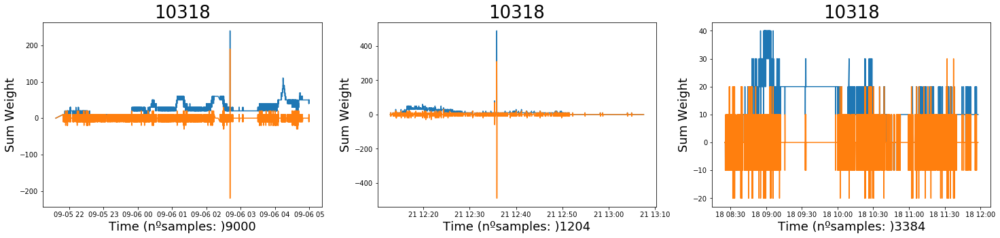

In [120]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))


teste=verdadeiros.loc[2959][0:9000]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=verdadeiros.loc[5832]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=verdadeiros.loc[[9580]]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)


In [ ]:
verdadeiros.loc[9760]

In [ ]:
class0.loc[[11360]]

In [ ]:
ruido=DATA2.groupby('measurement').filter(lambda x: x['7450332'].nunique()<5 and x['7450333'].nunique()<5 and x['7450339'].nunique()<5 and x['7450340'].nunique()<5 and x['7450338'].nunique()<5 and x['7450337'].nunique()<5 and x['7450336'].nunique() <5 and x['7450341'].nunique()<5).set_index('measurement')

In [ ]:
class1.loc[[7030]]

In [ ]:
teste=verdadeiros.loc[[13106]]#verdadeiros.loc[[7030]]
plt.plot(teste.timestamp, teste[['peso','diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=dados.loc[10318]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[10318]
plt.subplot(1, 3, 2)
plt.plot(dados.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[10318]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:

for i in range(novos_diff.shape[0]):
    if DATA['period'][i] < pd.Timedelta(31, unit='s'):  #4
        DATA['measurement'][i]=a
    else:
        a=a+1
        DATA['measurement'][i]=a

In [ ]:
DATA2 = DATA.groupby('measurement').filter(lambda x: len(x) > 5)
DATA2.head()

In [ ]:
bons_interpolados=pd.concat([DATA.fillna(method='ffill'), bons.reset_index()['measurement']], axis=1, sort=False).set_index('measurement')

In [ ]:
bons.reset_index().measurement.value_counts().head(60)

In [ ]:
contagens=bons.reset_index().measurement.value_counts().to_frame().reset_index().rename(columns={"index": "measurement", "measurement": "amostras"}).set_index('measurement')

In [ ]:
contagens.amostras.value_counts().head(50)#.value_counts()#.sortValues(amostras)

In [ ]:
# PROCURAR UM MAU
dados=bons.loc[9937]
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plt.plot(dados.timestamp, dados[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])#, 'g')
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])
plt.xlabel('Time', fontsize=18)
plt.ylabel('Weight', fontsize=18)
plt.title('Weighing 12980', fontsize=26)

In [ ]:
dados=bons.loc[12980]
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plt.plot(dados.timestamp, dados[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])#, 'g')
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])
plt.xlabel('Time', fontsize=18)
plt.ylabel('Weight', fontsize=18)
plt.title('Weighing 12980', fontsize=26)

### Manutençao:
- se a celula nao desliga?

### Anomalia:
- identificar/comparar trends
- comparar 2 series
    - Chow test
    - t-test
    - covariancia/correlaçao
    - wilcoxon rank sum test

Duas series comparaveis (BOAS)

13076 / 13085

In [ ]:
#teste=bons.loc[3023]#[2500:2900]
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,5))

teste=bons.loc[13076]
plt.subplot(1, 2, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=bons.loc[13085]
plt.subplot(1, 2, 2)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)


In [ ]:
bons_interpolados=pd.concat([bons.reset_index().groupby('measurement').fillna(method='ffill'), bons.reset_index()['measurement']], axis=1, sort=False).set_index('measurement')

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,5))

teste=bons_interpolados.loc[13076]
plt.subplot(1, 2, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=bons_interpolados.loc[13085]
plt.subplot(1, 2, 2)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)

In [ ]:
fig = plt.figure(figsize=(20,15))

teste=bons.loc[7030]#[:50]
plt.subplot(2, 2, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=bons.loc[13085]
plt.subplot(2, 2, 2)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)

teste=bons_interpolados.loc[7030]#[:50]
plt.subplot(2, 2, 3)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=bons_interpolados.loc[13085]
plt.subplot(2, 2, 4)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)

In [ ]:
fig = plt.figure(figsize=(20,10))

teste=bons.loc[7030]#[:50]
plt.subplot(2, 2, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
plt.title('Weighing 7030', fontsize=20)

teste=bons.loc[7030][:30]
plt.subplot(2, 2, 2)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
plt.title('Weighing 7030 Crop', fontsize=20)

import seaborn as sns#; sns.set_theme(color_codes=True)
#iris = sns.load_dataset("iris")
#species = iris.pop("species")
g = sns.clustermap(teste.corr())

### Baseline : assess stats within bridge: 13085

#### Corr & Cov

In [ ]:
teste=bons_interpolados.loc[13085]
import seaborn as sns

fig = plt.figure(figsize=(20,5))
plt.subplot(1, 2, 1)
ax = sns.heatmap(teste.corr(),square=True)
ax.set_title('Correlation', fontsize=26)
ax.set_ylabel('13085', fontsize=26)#, title='corr')#uniform_data, vmin=0, vmax=1)
#ax.title('Correlation', fontsize=26)


plt.subplot(1, 2, 2)
ax = sns.heatmap(teste.cov(),square=True)#uniform_data, vmin=0, vmax=1)
ax.set_title('Covariance', fontsize=26)

In [ ]:
teste=bons_interpolados.loc[7030]
import seaborn as sns

fig = plt.figure(figsize=(20,5))
plt.subplot(1, 2, 1)
ax = sns.heatmap(teste.corr(),square=True)
ax.set_title('Correlation', fontsize=26)
ax.set_ylabel('7030', fontsize=26)#, title='corr')#uniform_data, vmin=0, vmax=1)
#ax.title('Correlation', fontsize=26)


plt.subplot(1, 2, 2)
ax = sns.heatmap(teste.cov(),square=True)#uniform_data, vmin=0, vmax=1)
ax.set_title('Covariance', fontsize=26)

In [ ]:
teste.head(2)

In [ ]:
from scipy.stats import ttest_ind

#cat1 = my_data[my_data['Category']=='cat1']
#cat2 = my_data[my_data['Category']=='cat2']
teste=bons_interpolados.loc[13085]
ttest_ind(teste['7450332'], teste['7450333'])

In [ ]:
teste=bons_interpolados.loc[13076]
ttest_ind(teste['7450332'], teste['7450333'])

In [ ]:
teste=bons_interpolados.loc[7030]
ttest_ind(teste['7450332'], teste['7450333'])

In [ ]:
ttest_ind(bons_interpolados.loc[13076]['7450332'], bons_interpolados.loc[7030]['7450332'])#,  equal_var=False)

In [ ]:
from scipy.stats import ttest_ind
ttest_ind(*my_data.groupby('Category')['value'].apply(lambda x:list(x)))

We can test the hypothesis that two independent unequal-sized samples are drawn from the same distribution with computing the Wilcoxon rank-sum statistic

- Null hypothesis that two sets of measurements are drawn from the same distribution.
- The alternative hypothesis is that values in one sample are more likely to be larger than the values in the other sample.

https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ranksums.html

In [ ]:
from scipy.stats import ranksums
sample1 = np.random.uniform(-1, 1, 200)
sample2 = np.random.uniform(-0.5, 1.5, 300) # a shifted distribution
ranksums(sample1, sample2)
#RanksumsResult(statistic=-7.887059, pvalue=3.09390448e-15)

In [ ]:
teste=bons_interpolados.loc[7030]
ranksums(teste['7450332'], teste['7450333'])

In [ ]:
teste=bons_interpolados.loc[13076]
ranksums(teste['7450332'], teste['7450333'])

In [ ]:
ranksums(bons_interpolados.loc[13076]['7450332'], bons_interpolados.loc[7030]['7450332'])

In [ ]:
ranksums(teste['7450332'], bons_interpolados.loc[3023]['7450332'])

In [ ]:
ranksums(teste['7450332'], bons_interpolados.loc[13076]['7450332'])

The p-value of less than 0.05 indicates that this test rejects the hypothesis at the 5% significance leve

In [ ]:
sample1 = np.random.uniform(-1, 1, 200)
plt.plot(sample1)

In [ ]:
sample2 = np.random.uniform(-0.5, 1.5, 300)
plt.plot(sample2)

The Chow Test tests if the true coefficients in two different regression models are equal. The null hypothesis is they are equal and the alternative hypothesis is they are not

The Chow Test and returned a p-value of approximately 0.0009. We can reject the null hypothesis that the pre-Euro and post-Euro models are the same.

https://towardsdatascience.com/the-time-series-they-are-a-changing-why-all-good-models-eventually-fail-24a96a5f48d3

https://gist.github.com/jkclem/49aa838585a8311e87e583c3e322309b

In [ ]:
bons_interpolados


## ALTERNATIVA

In [ ]:
#bons_interpolados_soma=
novos=pd.concat([bons_interpolados[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']].sum(axis=1).to_frame(), bons_interpolados[['0','timestamp','period']]], axis=1, sort=False).rename(columns={0: "peso"})

In [ ]:
novos

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,5))

teste=bons_interpolados.loc[13076]
plt.subplot(1, 2, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[13076]
plt.subplot(1, 2, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)

In [ ]:
#novos['diff2']=
novos_diff=pd.concat([novos.reset_index(), novos.reset_index().groupby('measurement')['peso'].diff().to_frame().rename(columns={'peso': "diff"})], axis=1, sort=False).set_index('measurement')#['peso']

In [ ]:
novos_diff

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[13076]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[13076]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('13076', fontsize=26)

teste=novos_diff.loc[13076]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[13085]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[13085]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('13085', fontsize=26)

teste=novos_diff.loc[13085]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[7030]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[7030]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('7030', fontsize=26)

teste=novos_diff.loc[7030]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)


In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[2]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[2]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('2', fontsize=26)

teste=novos_diff.loc[2]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[8]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[8]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('9872', fontsize=26)

teste=novos_diff.loc[8]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
forcluster=novos_diff.reset_index().groupby('measurement')['diff'].mean().to_frame().rename(columns={"diff": "mean"})

In [ ]:
forcluster['std']=novos_diff.reset_index().groupby('measurement')['diff'].std()
forcluster['meanpeso']=novos_diff.reset_index().groupby('measurement')['peso'].mean()
forcluster['stdpeso']=novos_diff.reset_index().groupby('measurement')['peso'].std()

In [ ]:
forcluster['max']=novos_diff.reset_index().groupby('measurement')['peso'].max()
forcluster['min']=novos_diff.reset_index().groupby('measurement')['peso'].min()

In [ ]:
forcluster['mediandiff']=novos_diff.reset_index().groupby('measurement')['diff'].median()
forcluster['medianpeso']=novos_diff.reset_index().groupby('measurement')['peso'].median()

In [ ]:
forcluster['counts']=novos_diff.reset_index().groupby('measurement')['peso'].count()#['peso'].min()

In [ ]:
forcluster

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
from sklearn import datasets

#X = Y #dataFinal
#KMeans
km = KMeans(n_clusters=3)
km.fit(forcluster)
km.predict(forcluster)
labels = km.labels_

In [ ]:
from scipy.spatial.distance import cdist
distortions = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k).fit(forcluster)
    km.fit(forcluster)
    distortions.append(sum(np.min(cdist(forcluster, km.cluster_centers_, 'euclidean'), axis=1)) / forcluster.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
forcluster['Kmeans_label']=labels#.value_counts()

In [ ]:
forcluster.columns

In [ ]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

X=forcluster

trace = go.Scatter3d(
    x= X.values[:, 8],  
    y= X.values[:, 6],
    z= X.values[:, 0],  
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': labels,
    }
)


In [ ]:
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [ ]:
forcluster['Kmeans_label'].value_counts()

In [ ]:
class1=forcluster[forcluster['Kmeans_label']==1]
class1

In [ ]:
class1.sort_values(by=['counts'],ascending=False).head(30)#.counts.max()

In [ ]:
class1[class1.counts==2991]

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[10318]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[10318]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[10318]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)


fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[10319]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[10319]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10319', fontsize=26)

teste=novos_diff.loc[10319]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
teste=bons_interpolados.loc[2994][125:135]#[570:590]#2998[170:190]

plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
plt.title('2994[125:135]', fontsize=18)
plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

In [ ]:
class2=forcluster[forcluster['Kmeans_label']==2]
class2#.loc[13085]

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[23]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[23]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('23', fontsize=26)

teste=novos_diff.loc[23]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[22]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[22]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[22]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[82]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[82]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[82]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[13038]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[13038]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[13038]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[13042]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[13042]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[13042]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[7030]#[125:135]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)
#plt.legend(['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341'])

teste=novos.loc[7030]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('10318', fontsize=26)

teste=novos_diff.loc[7030]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[6739][570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[6739]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('9872', fontsize=26)

teste=novos_diff.loc[6739]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
class0=forcluster[forcluster['Kmeans_label']==0]
class0

In [ ]:
class0.sort_values(by=['counts'],ascending=False)#.max()

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,5))

teste=bons_interpolados.loc[13037]#[570:590]#2998[170:190]
plt.subplot(1, 3, 1)
plt.plot(teste.timestamp, teste[['7450332','7450333','7450339','7450340','7450338','7450337','7450336','7450341']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos.loc[13037]
plt.subplot(1, 3, 2)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Sum Weight', fontsize=18)
plt.title('13037', fontsize=26)

teste=novos_diff.loc[13037]
plt.subplot(1, 3, 3)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight Diff', fontsize=18)

In [ ]:
novos_diff

In [ ]:
bons.reset_index().measurement.value_counts().head(60)

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,5))

teste=novos.loc[7030]
plt.subplot(1, 2, 1)
plt.plot(teste.timestamp, teste[['peso']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)
#plt.title('Processed Data Retrieved', fontsize=26)


teste=novos_diff.loc[7030]
plt.subplot(1, 2, 2)
plt.plot(teste.timestamp, teste[['diff']])
plt.xlabel('Time (nºsamples: )'+str(teste.shape[0]), fontsize=18)
plt.ylabel('Weight', fontsize=18)

In [ ]:
novos